# Water Security

### Downloading all data

In [1]:
# Make sure you've run aws configure before hand
!aws s3 sync s3://s3groupegypt data

In [69]:
import datetime as dateformat
import pandas as pd
import numpy as np
from shapely.geometry import Point, box
import matplotlib.pyplot as plt
import geopandas
import geoplot
import h5py
import warnings
from tqdm import tqdm
import pickle
import re
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
from sklearn import preprocessing
from bioinfokit.analys import get_data
from bioinfokit.visuz import cluster
import plotly.express as px

warnings.filterwarnings('ignore')

# Checkpoint (save/load)

In [3]:

def save_checkpoint(df, name):
    with open(name, 'wb') as handle:
        pickle.dump(df, handle, protocol=pickle.HIGHEST_PROTOCOL)

def load_checkpoint(name):
    with open(name, 'rb') as handle:
        return pickle.load(handle)

# Do not uncomment this unless you want to save a new version of the master dataframe
# save_checkpoint(master_df, name='data/master_df.pickle')

master_df = load_checkpoint('data/master_df.pickle')

/Users/hanimustafa/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:280: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(projparams)


In [4]:
future_df = load_checkpoint('data/future_df.pickle')

# Shortcut

In [5]:
df_2002 = future_df.filter(regex=".*2002.*")
df_2002.head()

,2002_ACond_tavg,2002_Albedo_inst,2002_AvgSurfT_inst,2002_CanopInt_inst,2002_ECanop_tavg,2002_ESoil_tavg,2002_Evap_tavg,2002_LWdown_f_tavg,2002_Lwnet_tavg,2002_Psurf_f_inst,...,2002_qrdif,2002_qrswb,2002_qs,2002_reservoirstor,2002_riverstor,2002_soilmoist,2002_swe,2002_tws,2002_disnat,2002_ncrunnat
0,0.015878,-797.402344,263.706390,0.017147,1.908418,21.825941,0.000013,239.650482,-37.822739,96450.898438,...,4.597580e-07,0.0,0.000016,0.0,1.119026,4.990423,125.327629,219.758545,30.033447,0.000017
1,0.016257,40.627853,263.834106,0.022653,1.727004,21.702087,0.000012,238.877914,-39.176754,97299.578125,...,4.508866e-07,0.0,0.000014,0.0,17.728624,6.836684,109.871010,241.755264,158.142258,0.000015
2,0.016854,39.527771,264.719360,0.013842,1.352927,21.360184,0.000012,244.676712,-35.660313,96984.726562,...,2.041838e-07,0.0,0.000013,0.0,0.885883,11.314640,112.133255,133.964417,20.043909,0.000013
3,0.016709,40.277222,264.613647,0.024693,2.167677,22.542894,0.000013,242.888138,-37.833057,98848.265625,...,3.057511e-07,0.0,0.000008,0.0,5.546623,10.892810,98.257339,142.970200,78.686592,0.000009
4,0.017003,39.520100,264.984039,0.014792,1.355873,21.826279,0.000012,244.243591,-37.263218,97825.976562,...,2.004731e-07,0.0,0.000011,0.0,1.746596,11.060456,89.308006,105.613464,17.511963,0.000011


In [6]:
df_2050 = future_df.filter(regex=".*2050.*")
df_2050.head()

,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,...,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050
0,-0.013869,-925.042221,250.929574,0.029180,3.752627,24.536195,0.000012,189.540770,-44.851951,94761.175551,...,0.000026,0.0,1.488575,10.169959,161.046802,270.916386,49.303485,0.000027,1.488680e-07,8.299796e-09
1,-0.011389,72.577574,254.058168,0.022557,4.405940,25.275895,0.000013,198.141227,-47.528701,101079.139476,...,0.000021,0.0,24.910480,14.462152,127.916474,287.398170,260.792866,0.000023,1.975025e-06,1.041296e-07
2,-0.003665,33.197989,258.834864,0.016525,3.227895,26.701101,0.000013,202.450659,-56.975382,97894.578929,...,0.000022,0.0,1.348462,22.316837,158.335091,193.445806,35.564006,0.000023,1.248700e-10,6.272343e-12
3,-0.004645,-1109.564013,257.299404,0.016314,3.921367,25.212307,0.000013,201.360342,-54.558425,101690.394761,...,0.000013,0.0,7.579524,21.924630,129.470585,191.178559,128.054133,0.000013,9.669922e-07,4.876056e-08
4,-0.002767,32.830386,259.587475,0.023407,3.655577,25.551612,0.000013,203.671407,-58.685369,100679.494830,...,0.000020,0.0,2.808489,20.629852,144.748873,172.991597,32.058340,0.000020,1.907579e-09,9.607283e-11


# PCA 2050

In [7]:
# Display max columns & rows for viewing purposes
pd.set_option('display.max_columns', 2203)
pd.set_option('display.max_rows', 2203)

# Reduce decimal points to 2
pd.options.display.float_format = '{:,.2f}'.format

In [8]:
print('Dimensions of the dataset:',df_2050.shape)

Dimensions of the dataset: (10652, 80)


In [9]:
# New df with variables relating to 2050 only + lon, lat, geometry
var_2050 = future_df.loc[:, future_df.columns.str.contains('2050')]
geom = master_df[['lon','lat','geometry']]
df_geo = pd.concat([geom, var_2050], axis=1)
df_geo = pd.DataFrame(df_geo)
df_geo.shape

(10880, 83)

In [10]:
# Treating missing values (-9999)

df_geo.replace(-9999, np.NaN, inplace = True)

In [11]:
df_geo.isna().sum()

lon                              0
lat                              0
geometry                         0
2050_ACond_tavg                257
2050_Albedo_inst               257
2050_AvgSurfT_inst             257
2050_CanopInt_inst             257
2050_ECanop_tavg               257
2050_ESoil_tavg                257
2050_Evap_tavg                 257
2050_LWdown_f_tavg             228
2050_Lwnet_tavg                257
2050_Psurf_f_inst              228
2050_Qair_f_inst               228
2050_Qg_tavg                   257
2050_Qh_tavg                   257
2050_Qle_tavg                  257
2050_Qs_acc                    257
2050_Qsb_acc                   257
2050_Qsm_acc                   257
2050_Rainf_f_tavg              228
2050_Rainf_tavg                257
2050_SWE_inst                  257
2050_SWdown_f_tavg             228
2050_SnowDepth_inst            257
2050_SnowT_tavg                257
2050_Snowf_tavg                257
2050_SoilMoist_P_inst          257
2050_SoilMoist_RZ_in

In [12]:
print('Dimensions of the dataset:', df_geo.shape)
print('Dimensions after removing rows:', df_geo.dropna(axis=0).shape)

Dimensions of the dataset: (10880, 83)
Dimensions after removing rows: (10623, 83)


In [13]:
df_geo = df_geo.dropna(axis=0)

In [14]:
df_geo.dtypes

lon                             float64
lat                             float64
geometry                       geometry
2050_ACond_tavg                 float64
2050_Albedo_inst                float64
2050_AvgSurfT_inst              float64
2050_CanopInt_inst              float64
2050_ECanop_tavg                float64
2050_ESoil_tavg                 float64
2050_Evap_tavg                  float64
2050_LWdown_f_tavg              float64
2050_Lwnet_tavg                 float64
2050_Psurf_f_inst               float64
2050_Qair_f_inst                float64
2050_Qg_tavg                    float64
2050_Qh_tavg                    float64
2050_Qle_tavg                   float64
2050_Qs_acc                     float64
2050_Qsb_acc                    float64
2050_Qsm_acc                    float64
2050_Rainf_f_tavg               float64
2050_Rainf_tavg                 float64
2050_SWE_inst                   float64
2050_SWdown_f_tavg              float64
2050_SnowDepth_inst             float64


In [15]:
# Scaling the data (normalising floats)
# If we fail to do it, then the features with numerical values far greater than others will tend to dominate.

# Keeping floats only and turn them into ndarrays with DataFrame.values
x = df_geo.iloc[:, 3:].values

# Standardization
x = StandardScaler().fit_transform(x)
             
# back to dataframe
df = pd.DataFrame(x, columns=list(df_geo.iloc[:, 3:].columns))

# Quick look 
df.sample(10)

,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,2050_Qair_f_inst,2050_Qg_tavg,2050_Qh_tavg,2050_Qle_tavg,2050_Qs_acc,2050_Qsb_acc,2050_Qsm_acc,2050_Rainf_f_tavg,2050_Rainf_tavg,2050_SWE_inst,2050_SWdown_f_tavg,2050_SnowDepth_inst,2050_SnowT_tavg,2050_Snowf_tavg,2050_SoilMoist_P_inst,2050_SoilMoist_RZ_inst,2050_SoilMoist_S_inst,2050_SoilTMP0_10cm_inst,2050_SoilTMP10_29cm_inst,2050_SoilTMP144_295cm_inst,2050_SoilTMP295_1295cm_inst,2050_SoilTMP29_68cm_inst,2050_SoilTMP68_144cm_inst,2050_Swnet_tavg,2050_TVeg_tavg,2050_TWS_inst,2050_Tair_f_inst,2050_Wind_f_inst,2050_anag,2050_anas,2050_atotuse,2050_canopystor,2050_dis,2050_evap,2050_glolakestor,2050_glowetlandstor,2050_groundwstor,2050_loclakestor,2050_locwetlandstor,2050_ncrun,2050_pdomuse,2050_pdomww,2050_pgwuse,2050_pgwww,2050_pinduse,2050_pindww,2050_pirruse,2050_pirrww,2050_plivuse,2050_pnag,2050_pnas,2050_potevap,2050_precmon,2050_ptotuse,2050_ptotww,2050_qg,2050_ql,2050_qr,2050_qrdif,2050_qrswb,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050
9147,-0.19,0.11,0.32,-0.01,-0.09,1.60,0.78,0.61,1.54,0.90,0.80,0.21,-0.69,0.79,1.60,0.11,-0.34,2.08,2.22,-0.02,-0.75,-0.13,0.32,-0.56,0.47,1.01,1.18,0.16,0.16,0.19,0.28,0.17,0.18,-0.50,0.37,0.40,0.38,0.31,-3.94,8.26,6.60,-0.06,4.33,0.85,2.23,1.20,0.26,0.67,-0.26,0.58,1.12,4.27,0.07,0.10,10.77,14.32,3.10,3.80,2.84,-3.62,6.14,-0.26,0.90,5.09,8.64,1.82,1.47,1.28,1.48,-0.13,1.26,-0.08,0.64,-0.56,-0.16,-0.10,4.79,1.33,12.09,6.71
2903,4.48,0.12,0.24,-0.33,0.04,0.18,0.63,0.36,0.69,0.70,0.76,-0.06,-0.06,0.65,-0.49,0.09,-0.35,0.46,0.60,-0.02,0.11,-0.13,0.24,-0.53,1.19,0.66,0.76,0.07,0.08,0.13,0.25,0.09,0.11,0.23,0.89,1.02,0.19,0.66,-0.86,0.65,0.22,-0.49,-0.09,1.08,-0.05,-0.27,0.16,-0.36,-0.36,0.99,-0.23,-0.27,-0.14,-0.16,-0.10,-0.11,0.26,0.31,2.01,-0.76,0.58,0.14,1.24,0.22,0.18,0.67,1.14,0.53,0.66,-0.13,1.26,-0.08,-0.10,0.69,-0.16,-0.16,-0.10,1.02,-0.15,-0.18
860,-0.12,0.14,-0.25,-0.25,-0.22,0.63,0.03,-0.19,0.83,0.01,-0.31,0.11,-0.44,0.03,0.01,0.11,-0.01,0.03,0.05,0.03,-0.65,-0.02,-0.25,-0.07,0.89,0.22,0.33,-0.42,-0.43,-0.47,-0.36,-0.45,-0.47,-0.67,-0.23,0.78,-0.25,0.99,-0.04,-0.17,-0.21,0.14,-0.13,0.05,-0.05,-0.27,0.09,-0.30,0.33,-0.57,-0.22,-0.26,-0.21,-0.22,-0.10,-0.11,-0.24,-0.22,-0.14,-0.01,-0.19,-0.51,-0.34,-0.23,-0.23,-0.28,-0.57,-0.26,-0.25,-0.07,-0.67,-0.08,-0.14,-0.03,-0.16,-0.16,-0.14,-0.59,-0.19,-0.21
6281,-0.20,0.14,-0.27,-0.28,-0.23,-0.52,-0.40,-0.26,0.30,0.72,-0.00,0.09,-0.12,-0.39,-0.04,-0.00,0.68,-0.44,-0.71,0.13,-0.53,0.19,-0.27,0.95,-0.60,-0.41,-0.26,-0.22,-0.23,-0.26,-0.28,-0.23,-0.24,-0.54,-0.24,-0.47,-0.29,0.26,-0.00,-0.18,-0.19,0.44,-0.13,-0.20,-0.05,-0.27,0.10,-0.34,-0.36,-0.10,0.65,0.44,-0.20,-0.20,-0.09,-0.10,-0.24,-0.23,-0.78,0.03,-0.19,-0.64,-0.21,-0.21,-0.18,-0.09,-0.14,-0.09,-0.03,-0.13,-0.19,-0.08,-0.12,0.30,-0.16,-0.16,-0.13,-0.12,-0.18,-0.20
513,-2.17,0.14,-0.26,4.69,0.39,-0.40,0.71,-0.27,0.22,-0.21,-0.19,0.69,-1.32,0.67,0.41,0.42,2.66,0.90,0.10,0.41,-0.57,0.58,-0.27,2.79,0.46,0.54,0.69,-0.24,-0.24,-0.31,-0.49,-0.24,-0.26,-0.49,1.14,0.52,-0.29,-1.24,-0.31,0.02,-0.15,2.53,-0.11,-0.56,1.30,-0.23,0.09,0.05,-0.36,-0.20,0.05,0.10,-0.20,-0.18,-0.06,-0.04,0.01,-0.00,-0.19,-0.26,0.12,-0.34,-0.53,-0.01,-0.01,-0.22,-0.22,-0.27,-0.23,-0.13,-0.19,-0.08,-0.11,-0.53,-0.16,-0.15,-0.11,-0.21,-0.05,-0.13
3134,-0.35,-4.21,-1.84,-0.52,-0.85,-1.67,-1.20,-2.20,-1.18,-1.99,-1.22,0.22,-0.36,-1.17,-1.10,0.11,-1.61,-1.35,-0.99,-0.65,-1.02,-0.87,-1.84,-1.20,-3.49,-4.27,-3.80,-2.53,-2.53,-2.57,-2.60,-2.53,-2.53,-1.00,-0.60,-3.20,-2.12,1.72,-0.04,-0.19,-0.23,-0.74,-0.13,-1.09,-0.05,-0.27,0.06,-0.36,-0.36,-0.63,-0.23,-0.29,-0.22,-0.23,-0.10,-0.11,-0.24,-0.23,-0.41,-0.01,-0.20,-1.48,-0.37,-0.24,-0.24,-0.59,-0.74,-0.59,-0.58,-0.13,-0.74,-0.08,-0.14,0.27,2.71,2.70,-0.14,-0.65,-0.20,-0.22
608,-0.84,0.11,-0.14,-0.20,0.09,-0.33,-0.15,-0.24,0.06,-1.20,-0.38,1

In [16]:
df.describe()

,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,2050_Qair_f_inst,2050_Qg_tavg,2050_Qh_tavg,2050_Qle_tavg,2050_Qs_acc,2050_Qsb_acc,2050_Qsm_acc,2050_Rainf_f_tavg,2050_Rainf_tavg,2050_SWE_inst,2050_SWdown_f_tavg,2050_SnowDepth_inst,2050_SnowT_tavg,2050_Snowf_tavg,2050_SoilMoist_P_inst,2050_SoilMoist_RZ_inst,2050_SoilMoist_S_inst,2050_SoilTMP0_10cm_inst,2050_SoilTMP10_29cm_inst,2050_SoilTMP144_295cm_inst,2050_SoilTMP295_1295cm_inst,2050_SoilTMP29_68cm_inst,2050_SoilTMP68_144cm_inst,2050_Swnet_tavg,2050_TVeg_tavg,2050_TWS_inst,2050_Tair_f_inst,2050_Wind_f_inst,2050_anag,2050_anas,2050_atotuse,2050_canopystor,2050_dis,2050_evap,2050_glolakestor,2050_glowetlandstor,2050_groundwstor,2050_loclakestor,2050_locwetlandstor,2050_ncrun,2050_pdomuse,2050_pdomww,2050_pgwuse,2050_pgwww,2050_pinduse,2050_pindww,2050_pirruse,2050_pirrww,2050_plivuse,2050_pnag,2050_pnas,2050_potevap,2050_precmon,2050_ptotuse,2050_ptotww,2050_qg,2050_ql,2050_qr,2050_qrdif,2050_qrswb,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050
count,"10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00","10,623.00"
mean,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-9.49,-5.62,-2.87,-5.95,-2.16,-3.84,-1.74,-2.32,-6.79,-5.26,-2.78,-4.05,-5.46,-1.71,-11.44,-35.21,-6.89,-2.69,-2.35,-13.70,-2.10,-12.64,-2.87,-12.75,-4.35,-5.67,-5.35,-4.34,-4.37,-4.91,-5.69,-4.44,-4.61,-2.53,-1.84,-6.85,-2.73,-3.74,-19.95,-3.49,-2.26,-1.37,-0.19,-1.84,-59.73,-0.74,-32.07,-5.19,-0.67,-13.89,-17.83,-22.86,-2.71,-2.30,-1.41,-21.47,-2.53,-2.58,-2.96,-22.32,-3.07,-1.52,-1.41,-2.14,-8.37,-1.48,-1.49,-1.67,-1.23,-2.50,-1.65,-0.30,-0.19,-0.91,-0.25,-1.55,-0.20,-18.46,-0.20,-0.22
25%,-0.43,0.11,-0.80,-0.52,-0.65,-0.70,-0.64,-0.85,-0.58,-0.32,-0.71,-0.51,-0.68,-0.65,-0.10,0.11,-0.35,-0.67,-0.64,-0.02,-0.88,-0.13,-0.80,-0.53,-0.59,-0.44,-0.60,-0.63,-0.62,-0.60,-0.57,-0.62,-0.62,-0.79,-0.60,-0.50,-0.80,-0.64,-0.04,-0.19,-0.23,-0.74,-0.13,-0.73,-0.05,-0.27,0.07,-0.36,-0.36,-0.57,-0.23,-0.28,-0.22,-0.23,-0.10,-0.11,-0.24,-0.23,-0.41,-0.01,-0.20,-0.86,-0.59,-0.24,-0.24,-0.56,-0.61,-0.55,-0.55,-0.13,-0.63,-0.08,-0.13,-0.69,-0.16,-0.17,-0.13,-0.57,-0.20,-0.22
50%

In [17]:
# Scaling and centering the data + turning it into np.ndarry
scaled_data = preprocessing.scale(df)
# PCA
pca = PCA()
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

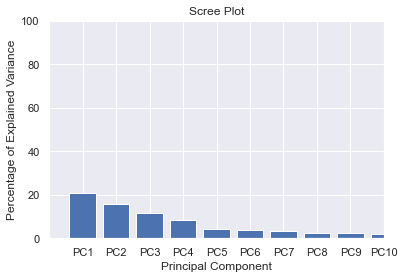

In [18]:
# Scree plot

# % of variation each PC accounts for:
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels =['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.ylim([0,100])
plt.xlim([0,10])
plt.show()

In [19]:
# Creating a PC plot
# First we put the new coordinates created by pca.transform(scaled.data) into a nice matrix, where the rows have sample labels and the columns have PC labels
pca_df = pd.DataFrame(pca_data, columns=labels)
pca_df["geometry"] = df_geo["geometry"] # adding back geometric locations
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,geometry
0,-3.72,-4.28,1.31,-2.16,0.27,-1.05,-0.17,3.15,-0.36,-0.05,0.71,-0.40,-0.89,-0.73,0.04,-0.09,0.18,-0.46,0.15,-0.45,0.24,1.36,-0.49,0.94,-0.14,0.34,-0.70,-0.05,-0.88,-0.41,0.27,-0.96,-0.63,0.08,0.02,-1.01,0.40,-0.12,0.28,0.17,-0.11,-0.23,0.13,-0.38,0.29,0.00,0.31,-0.22,0.15,0.04,-0.03,-0.06,-0.11,-0.08,0.05,-0.01,-0.15,0.00,-0.02,-0.06,-0.08,-0.01,0.01,-0.01,0.00,-0.00,-0.02,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,POINT (-179.50000 67.50000)
1,-3.37,-3.71,1.12,-2.24,0.18,-0.62,-0.09,2.22,-0.16,-0.26,0.52,0.04,-1.15,0.04,-1.02,0.15,0.53,-0.93,-0.09,0.00,-0.19,1.08,-0.38,1.13,-0.21,0.07,-0.12,-0.07,-0.76,0.17,0.29,-0.68,-0.65,0.12,0.38,-0.67,0.24,-0.03,0.17,0.05,-0.15,-0.04,0.12,-0.28,0.16,0.01,0.03,-0.09,0.08,0.04,0.01,0.10,-0.04,0.02,0.07,-0.01,-0.12,0.00,-0.02,-0.06,-0.02,0.02,-0.00,-0.01,-0.00,0.00,-0.02,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,POINT (-178.50000 67.50000)
2,-3.16,-3.06,0.85,-1.11,0.16,-0.92,-0.18,2.25,-0.17,-0.26,0.59,0.32,-0.80,-0.07,-0.68,0.38,1.04,-0.45,-0.16,0.36,-0.38,0.94,0.18,0.85,-0.10,0.23,-0.26,0.23,-0.18,0.56,0.31,-0.57,-0.26,0.02,0.59,-0.90,0.26,0.16,0.53,0.15,0.32,0.10,0.13,-0.02,-0.12,-0.04,0.10,-0.09,0.07,0.03,-0.08,0.10,-0.06,0.01,0.06,0.00,-0.03,-0.00,-0.03,-0.06,-0.04,0.01,0.00,-0.00,0.00,-0.00,-0.02,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,POINT (-177.50000 66.50000)
3,-3.64,-2.71,1.00,-2.25,0.11,-0.29,-0.25,1.15,-0.14,0.17,0.38,-0.07,0.13,-1.28,0.23,0.26,0.29,0.26,0.06,-0.29,0.19,1.13,-0.09,0.42,0.06,0.32,-0.70,-0.34,-0.82,-0.15,0.52,-0.63,-0.50,0.10,0.44,-0.56,-0.06,0.28,0.22,-0.02,0.13,0.05,0.02,-0.01,0.05,0.00,0.00,0.01,0.20,-0.01,-0.01,0.21,-0.10,0.03,0.00,0.00,-0.05,0.00,-0.03,-0.08,-0.03,0.03,-0.00,0.01,0.00,-0.01,-0.01,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,POINT (-177.50000 67.50000)
4,-3.31,-2.45,0.68,-0.39,0.11,-0.76,0.05,1.93,-0.13,-0.34,0.29,0.42,-0.78,0.05,-1.11,0.49,1.11,-0.28,-0.17,0.31,-0.35,1.26,0.47,0.83,-0.01,-0.05,-0.30,0.11,-0.17,0.96,0.41,-0.49,-0.08,-0.00,0.88,-1.07,0.01,0.11,0.61,0.08,0.40,0.14,0.19,-0.12,-0.06,-0.03,0.10,-0.05,0.11,0.04,-0.06,0.13,-0.07,0.08,0.03,0.01,-0.03,-0.00,-0.03,-0.06,-0.02,0.03,-0.00,0.00,0.00,0.00,-0.02,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,POINT (-176.50000 66.50000)


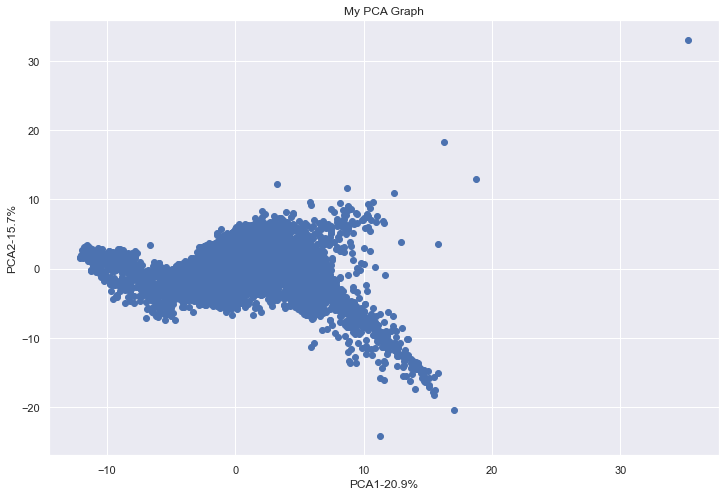

In [20]:
# Scatter plot

plt.rcParams['figure.figsize'] = [12, 8]
plt.scatter(pca_df.PC1, pca_df.PC2)
plt.title('My PCA Graph')
plt.xlabel('PCA1-{0}%'.format(per_var[0]))
plt.ylabel('PCA2-{0}%'.format(per_var[1]))

# for sample in pca_df.index: plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))

plt.show()

# points that cluster together tend to be similar

In [21]:
column_names=list(df.iloc[:, 3:].columns)

In [22]:
# Which variable had the biggest effect on separating the observations? => Loading scores on PCA 1

loading_scores = pd.Series(pca.components_[0])
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_10_vars = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_vars])

7    0.22
36   0.20
10   0.20
31   0.20
28   0.20
27   0.20
32   0.20
2    0.20
22   0.20
29   0.20
dtype: float64


In [23]:
pd.DataFrame(column_names).loc[[7, 36, 31, 28, 27, 32, 2, 22, 10, 29]]

,0
7,2050_Qair_f_inst
36,2050_anas
31,2050_TVeg_tavg
28,2050_SoilTMP29_68cm_inst
27,2050_SoilTMP295_1295cm_inst
32,2050_TWS_inst
2,2050_ESoil_tavg
22,2050_SoilMoist_RZ_inst
10,2050_Qle_tavg
29,2050_SoilTMP68_144cm_inst


## PCA on Data Grouped by Country 

In [26]:
def dataframe_to_geodataframe(df):
    crs = {'init': 'epsg:4326'}
    geo = [Point(row['lon'], row['lat']) for (_, row) in df[['lon', 'lat']].iterrows()]
    gdf = geopandas.GeoDataFrame(df, crs=crs, geometry=geo)
    return gdf

In [28]:
# importing SSP2 population data
# adding back ISO column
# px - Longitude 
# py - Latitude 

pop = pd.read_csv("data/SSP2/gdp_ssp2.csv")
ISO = pop[['px','py','ISO3']]
ISO = ISO.rename(columns={"px":"lon", "py":"lat"})

# Turning into WKT
ISO = dataframe_to_geodataframe(ISO)

# turning ISO into a GeoDataFrame from WKT format
gISO = geopandas.GeoDataFrame(ISO, geometry='geometry')
print(gISO.head())

      lon    lat ISO3                      geometry
0 -179.96 -16.38  FJI  POINT (-179.95988 -16.38242)
1 -179.94 -15.74  FJI  POINT (-179.94336 -15.73900)
2 -179.90 -16.79  FJI  POINT (-179.90168 -16.78760)
3 -179.86 -19.00  FJI  POINT (-179.86174 -19.00430)
4 -179.83 -18.96  FJI  POINT (-179.82871 -18.95897)


/Users/hanimustafa/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [29]:
# Turning df_geo into GeoDataFrames from WKT format
gdf = geopandas.GeoDataFrame(df_geo, geometry='geometry')
print(gdf.head())

      lon   lat                     geometry  2050_ACond_tavg  \
0 -179.50 67.50  POINT (-179.50000 67.50000)            -0.01   
1 -178.50 67.50  POINT (-178.50000 67.50000)            -0.01   
2 -177.50 66.50  POINT (-177.50000 66.50000)            -0.00   
3 -177.50 67.50  POINT (-177.50000 67.50000)            -0.00   
4 -176.50 66.50  POINT (-176.50000 66.50000)            -0.00   

   2050_Albedo_inst  2050_AvgSurfT_inst  2050_CanopInt_inst  2050_ECanop_tavg  \
0           -925.04              250.93                0.03              3.75   
1             72.58              254.06                0.02              4.41   
2             33.20              258.83                0.02              3.23   
3         -1,109.56              257.30                0.02              3.92   
4             32.83              259.59                0.02              3.66   

   2050_ESoil_tavg  2050_Evap_tavg  2050_LWdown_f_tavg  2050_Lwnet_tavg  \
0            24.54            0.00             

In [30]:
# Spatial join

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
cities = geopandas.read_file(geopandas.datasets.get_path('naturalearth_cities'))
countries = world[['geometry', 'name']]
countries = countries.rename(columns={'name':'country'})

df_2050 = geopandas.sjoin(gdf, countries, how="inner", op='intersects')
df_2050.sample(10)

<ipython-input-30-c79d79111ae8>:8: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  df_2050 = geopandas.sjoin(gdf, countries, how="inner", op='intersects')


,lon,lat,geometry,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,2050_Qair_f_inst,2050_Qg_tavg,2050_Qh_tavg,2050_Qle_tavg,2050_Qs_acc,2050_Qsb_acc,2050_Qsm_acc,2050_Rainf_f_tavg,2050_Rainf_tavg,2050_SWE_inst,2050_SWdown_f_tavg,2050_SnowDepth_inst,2050_SnowT_tavg,2050_Snowf_tavg,2050_SoilMoist_P_inst,2050_SoilMoist_RZ_inst,2050_SoilMoist_S_inst,2050_SoilTMP0_10cm_inst,2050_SoilTMP10_29cm_inst,2050_SoilTMP144_295cm_inst,2050_SoilTMP295_1295cm_inst,2050_SoilTMP29_68cm_inst,2050_SoilTMP68_144cm_inst,2050_Swnet_tavg,2050_TVeg_tavg,2050_TWS_inst,2050_Tair_f_inst,2050_Wind_f_inst,2050_anag,2050_anas,2050_atotuse,2050_canopystor,2050_dis,2050_evap,2050_glolakestor,2050_glowetlandstor,2050_groundwstor,2050_loclakestor,2050_locwetlandstor,2050_ncrun,2050_pdomuse,2050_pdomww,2050_pgwuse,2050_pgwww,2050_pinduse,2050_pindww,2050_pirruse,2050_pirrww,2050_plivuse,2050_pnag,2050_pnas,2050_potevap,2050_precmon,2050_ptotuse,2050_ptotww,2050_qg,2050_ql,2050_qr,2050_qrdif,2050_qrswb,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050,index_right,country
6710,60.50,59.50,POINT (60.50000 59.50000),0.03,27.05,271.32,0.00,16.46,20.50,0.00,246.49,-66.61,"101,122.73",0.00,-1.47,-8.31,47.95,0.01,-0.00,0.10,0.00,0.00,62.16,125.79,0.24,271.27,0.00,445.96,135.39,2.87,277.88,277.84,279.31,278.60,277.97,278.45,107.51,10.98,508.12,272.95,1.17,0.00,0.00,0.00,0.41,47.68,0.00,0.00,0.00,22.44,3.29,2.49,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.34,40.19,25.86,101.02,47.93,0.00,0.66,0.02,18,Russia
4699,18.50,67.50,POINT (18.50000 67.50000),-0.01,"1,562.63",262.78,0.05,3.12,26.29,0.00,221.45,-50.96,"85,929.38",0.00,-0.95,3.73,35.14,0.03,0.00,0.16,0.00,0.00,117.48,128.27,0.42,262.73,0.00,"1,068.30",230.02,5.13,273.27,273.19,273.37,273.30,273.13,273.41,95.68,5.73,"1,185.83",269.22,-1.47,0.00,-0.00,0.00,0.15,98.78,0.00,0.00,31.55,14.95,131.12,2.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,"1,472.47",4.32,9.26,57.50,"1,724.01",98.18,0.00,0.00,0.00,110,Sweden
8465,101.50,64.50,POINT (101.50000 64.50000),0.01,27.64,258.42,0.00,4.98,19.25,0.00,201.67,-64.33,"99,142.51",0.00,-1.77,12.28,44.24,-0.02,0.00,0.07,0.00,0.00,39.35,136.94,0.17,258.43,0.00,-151.03,-15.64,0.16,271.39,271.17,271.24,270.49,270.92,271.06,119.18,20.01,-111.67,266.11,1.19,0.00,-0.00,-0.00,0.06,812.20,0.00,0.00,192.97,0.83,0.00,194.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.41,9.26,33.25,496.00,812.20,0.00,0.00,0.00,18,Russia
2965,-53.50,-24.50,POINT (-53.50000 -24.50000),0.01,18.07,292.67,0.11,11.25,28.89,0.00,365.64,-47.01,"96,115.16",0.01,-0.10,7.86,109.29,0.54,0.00,0.00,0.00,0.00,0.00,195.16,0.00,292.62,-0.00,"1,392.18",351.50,7.17,292.62,292.64,292.92,293.42,292.67,292.75,164.07,69.15,"1,392.28",293.07,1.50,0.00,0.00,0.00,0.06,295.70,0.00,0.00,3.00,42.22,3.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.03,53.73,0.00,113.23,297.32,0.00,2.38,0.13,29,Brazil
6869,65.50,55.50,POINT (65.50000 55.50000),0.02,34.68,269.86,0.03,7.73,21.87,0.00,245.03,-63.41,"99,559.78",0.00,-1.10,18.95,36.35,0.03,-0.00,0.10,0.00,0.00,72.03,158.48,0.27,269.89,0.00,"1,136.87",289.39,5.84,279.60,279.53,279.98,280.31,279.60,279.79,122.43,6.76,"1,208.94",272.39,4.11,0.00,-0.00,0.00,0.17,57.96,0.00,0.00,0.00,7.01,9.63,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.39,48.66,19.08,90.93,64.80,0.00,1.02,0.03,18,Russia
2424,-66.50,-0.50,POINT (-66.50000 -0.50000),0.04,13.54,297.81,0.16,61.77,35.33,0.00,415.20,-29.71,"98,401.88",0.01,0.40,-97.30,303.58,-0.32,-0.00,0.00,0.

In [31]:
# Grouping by country - average

df_group = df_2050.groupby('country')
df_group.size()

country
Algeria                      172
Angola                        72
Argentina                    206
Australia                    596
Austria                        2
Bangladesh                     2
Belarus                       15
Benin                          1
Bolivia                       66
Botswana                      30
Brazil                       606
Bulgaria                       3
Burkina Faso                   9
Cambodia                       6
Cameroon                      18
Canada                      1103
Central African Rep.          29
Chad                          81
Chile                         16
China                        817
Colombia                      66
Congo                          9
Czechia                        1
Côte d'Ivoire                 14
Dem. Rep. Congo              147
Denmark                        1
Ecuador                        9
Egypt                         63
Eq. Guinea                     1
Eritrea                        3
Et

In [32]:
df2050_by_country = df_group.mean()

In [33]:
df2050_by_country2 = df2050_by_country.iloc[:,2:]
df2050_by_country2.head()

,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,2050_Qair_f_inst,2050_Qg_tavg,2050_Qh_tavg,2050_Qle_tavg,2050_Qs_acc,2050_Qsb_acc,2050_Qsm_acc,2050_Rainf_f_tavg,2050_Rainf_tavg,2050_SWE_inst,2050_SWdown_f_tavg,2050_SnowDepth_inst,2050_SnowT_tavg,2050_Snowf_tavg,2050_SoilMoist_P_inst,2050_SoilMoist_RZ_inst,2050_SoilMoist_S_inst,2050_SoilTMP0_10cm_inst,2050_SoilTMP10_29cm_inst,2050_SoilTMP144_295cm_inst,2050_SoilTMP295_1295cm_inst,2050_SoilTMP29_68cm_inst,2050_SoilTMP68_144cm_inst,2050_Swnet_tavg,2050_TVeg_tavg,2050_TWS_inst,2050_Tair_f_inst,2050_Wind_f_inst,2050_anag,2050_anas,2050_atotuse,2050_canopystor,2050_dis,2050_evap,2050_glolakestor,2050_glowetlandstor,2050_groundwstor,2050_loclakestor,2050_locwetlandstor,2050_ncrun,2050_pdomuse,2050_pdomww,2050_pgwuse,2050_pgwww,2050_pinduse,2050_pindww,2050_pirruse,2050_pirrww,2050_plivuse,2050_pnag,2050_pnas,2050_potevap,2050_precmon,2050_ptotuse,2050_ptotww,2050_qg,2050_ql,2050_qr,2050_qrdif,2050_qrswb,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050,index_right
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Algeria,0.02,37.60,303.78,0.00,0.53,11.74,0.00,381.19,-81.65,"94,785.56",0.00,0.65,55.30,12.98,0.00,0.00,-0.00,0.00,0.00,-0.01,232.77,-0.00,303.81,-0.00,481.58,129.54,1.25,303.72,303.61,302.25,299.80,303.40,302.98,150.57,0.71,481.57,302.64,6.05,0.00,0.00,0.00,0.00,18.64,0.00,-0.04,1.90,-22.93,-0.20,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.70,0.91,0.00,-18.54,19.03,0.00,0.21,0.02,82
Angola,0.02,14.80,298.50,0.03,10.85,39.75,0.00,356.80,-87.36,"87,852.68",0.01,0.80,53.20,83.13,0.03,-0.00,0.00,0.00,0.00,0.00,258.41,0.00,298.43,0.00,707.79,135.83,2.44,298.32,298.19,296.63,293.74,297.94,297.47,224.49,32.54,707.82,296.65,2.03,-0.00,0.00,0.00,0.00,128.38,0.00,0.00,15.16,48.02,-0.02,6.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.88,7.84,43.81,0.00,133.35,128.84,0.00,0.27,0.04,74
Argentina,0.03,14.82,292.56,0.00,4.06,33.41,0.00,334.67,-71.02,"94,468.17",0.01,0.49,69.12,44.34,0.02,-0.00,-0.01,0.00,0.00,-0.69,215.15,-0.00,292.49,-0.00,714.05,173.27,3.20,292.37,292.29,291.28,289.38,292.13,291.83,184.76,6.87,713.37,291.40,4.88,-0.00,0.00,0.00,0.03,362.10,0.00,-2.10,31.79,14.44,0.26,4.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19.44,20.55,27.01,0.07,116.23,369.20,0.00,0.92,0.03,9
Australia,0.03,19.27,301.49,0.01,2.41,20.06,0.00,372.56,-81.99,"97,798.91",0.01,0.23,93.56,26.70,0.01,-0.00,-0.00,0.00,0.00,-0.00,244.82,-0.00,301.43,-0.00,534.69,146.21,2.22,301.39,301.34,300.50,298.16,301.24,301.01,202.48,4.23,534.69,299.62,6.33,-0.00,0.00,0.00,0.01,45.63,0.00,0.17,2.12,7.02,-1.36,0.29,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.02,3.58,11.10,-0.00,25.92,47.84,0.00,0.14,0.00,137
Austria,-0.08,1.05,284.31,0.10,16.37,18.07,0.00,324.67,-37.37,"98,218.34",0.01,-0.65,24.53,78.94,-0.01,-0.02,-0.05,0.00,0.00,-26.12,130.75,-0.11,284.27,-0.00,"1,051.42",266.65,5.62,282.97,283.08,283.30,282.79,283.23,283.30,127.64,44.50,"1,025.40",284.70,-1.82,0.00,-0.00,0.00,0.31,66.00,0.00,0.00,0.00,33.60,0.18,0.18,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.43,191.70,-6.84,221.57,66.01,0.00,4.36,0.08,114


In [35]:
# PCA on df_2050 by country
# Removing lon, lat (non-numeric) data

df_2050_pca = df2050_by_country2.drop('index_right', axis=1)
df_2050_pca.sample()

,2050_ACond_tavg,2050_Albedo_inst,2050_AvgSurfT_inst,2050_CanopInt_inst,2050_ECanop_tavg,2050_ESoil_tavg,2050_Evap_tavg,2050_LWdown_f_tavg,2050_Lwnet_tavg,2050_Psurf_f_inst,2050_Qair_f_inst,2050_Qg_tavg,2050_Qh_tavg,2050_Qle_tavg,2050_Qs_acc,2050_Qsb_acc,2050_Qsm_acc,2050_Rainf_f_tavg,2050_Rainf_tavg,2050_SWE_inst,2050_SWdown_f_tavg,2050_SnowDepth_inst,2050_SnowT_tavg,2050_Snowf_tavg,2050_SoilMoist_P_inst,2050_SoilMoist_RZ_inst,2050_SoilMoist_S_inst,2050_SoilTMP0_10cm_inst,2050_SoilTMP10_29cm_inst,2050_SoilTMP144_295cm_inst,2050_SoilTMP295_1295cm_inst,2050_SoilTMP29_68cm_inst,2050_SoilTMP68_144cm_inst,2050_Swnet_tavg,2050_TVeg_tavg,2050_TWS_inst,2050_Tair_f_inst,2050_Wind_f_inst,2050_anag,2050_anas,2050_atotuse,2050_canopystor,2050_dis,2050_evap,2050_glolakestor,2050_glowetlandstor,2050_groundwstor,2050_loclakestor,2050_locwetlandstor,2050_ncrun,2050_pdomuse,2050_pdomww,2050_pgwuse,2050_pgwww,2050_pinduse,2050_pindww,2050_pirruse,2050_pirrww,2050_plivuse,2050_pnag,2050_pnas,2050_potevap,2050_precmon,2050_ptotuse,2050_ptotww,2050_qg,2050_ql,2050_qr,2050_qrdif,2050_qrswb,2050_qs,2050_reservoirstor,2050_riverstor,2050_soilmoist,2050_swe,2050_tws,2050_disnat,2050_ncrunnat,g2_2050,p2_2050
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
China,0.00,22.37,286.17,0.02,4.97,28.54,0.00,312.88,-58.85,"83,587.71",0.00,1.21,31.91,46.24,0.05,-0.00,-0.00,0.00,0.00,2.99,173.85,0.01,286.10,-0.00,955.11,225.19,4.21,286.85,286.53,284.44,282.23,286.00,285.27,138.93,12.73,958.12,285.35,0.57,-0.00,0.00,0.00,0.08,424.74,0.00,-4.95,13.32,-35.31,0.18,4.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,37.15,13.51,19.89,4.68,53.01,474.18,0.00,7.70,0.20


In [36]:
# StatQuest Method
# Scaling and centering the data
scaled_data = preprocessing.scale(df_2050_pca)
# PCA
pca = PCA()
pca_out = pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

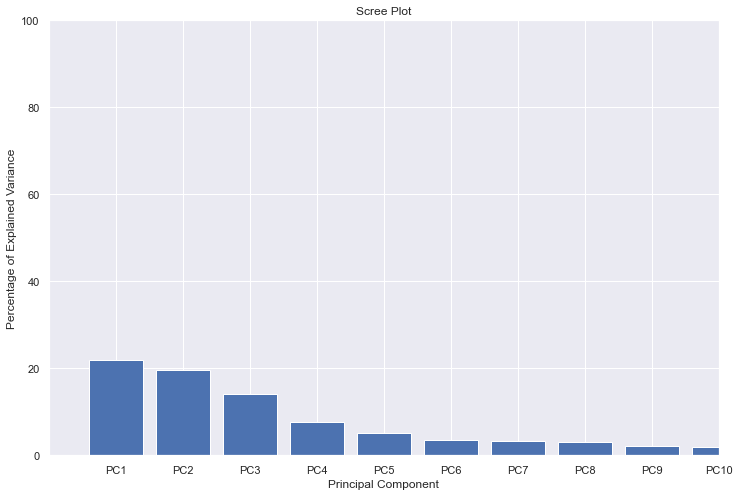

In [37]:
# Scree plot

# % of variation each PC accounts for:
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels =['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.ylim([0,100])
plt.xlim([0,10])
plt.show()

In [38]:
sum(per_var[0:10])

82.39999999999999

In [39]:
# Creating a PC plot
# First we put the new coordinates created by pca.transform(scaled.data) into a nice matrix, where the rows have sample labels and the columns have PC labels
pca_df = pd.DataFrame(pca_data, columns=labels)
pca_df["country"] = df2050_by_country2.index # adding back geometric locations
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,country
0,-4.53,-2.68,-1.53,0.21,-0.63,0.62,-0.25,-0.39,0.70,-0.88,0.41,0.59,0.23,-1.04,-0.58,0.16,-0.17,0.05,0.29,-0.04,-0.40,-0.13,0.40,-0.77,-0.20,-0.17,0.04,0.10,0.33,0.11,0.15,-0.06,0.20,-0.22,-0.05,-0.15,0.03,-0.01,0.01,0.10,-0.07,-0.09,0.12,0.13,-0.01,0.04,0.06,-0.00,0.02,-0.01,-0.03,0.02,-0.03,-0.03,0.00,-0.01,-0.03,-0.00,-0.00,-0.01,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,Algeria
1,-0.61,-1.51,-1.85,0.62,0.04,-0.46,0.31,0.56,-0.92,0.27,-0.15,0.16,-0.20,0.53,0.52,-0.63,-0.15,-0.12,-0.58,0.05,-0.43,0.36,0.06,-0.34,-0.34,-0.34,-0.04,-0.17,-0.11,0.20,0.09,-0.13,-0.12,0.21,-0.38,0.15,0.13,-0.07,0.10,-0.06,0.01,0.02,0.02,-0.05,-0.06,0.09,0.03,-0.00,0.07,-0.03,0.00,0.01,0.02,0.05,-0.04,-0.01,0.02,-0.01,0.01,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,Angola
2,-2.71,-0.13,-0.68,0.24,-0.22,-0.68,-0.07,-0.54,0.69,0.11,0.31,0.21,0.30,1.00,0.92,-0.50,0.49,0.49,-0.08,-0.13,-0.20,-0.15,0.13,-0.54,0.33,0.11,-0.14,-0.31,0.39,0.19,0.04,-0.09,0.07,-0.07,0.07,-0.07,0.22,0.03,-0.11,-0.09,0.04,-0.01,-0.05,0.06,-0.11,0.13,0.01,0.04,0.00,0.03,0.01,-0.08,0.03,0.06,-0.01,0.01,0.01,0.04,-0.01,-0.00,-0.01,0.00,-0.00,-0.00,0.01,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,Argentina
3,-3.43,-2.74,-1.56,0.19,-0.36,0.20,-0.25,-0.85,0.43,-0.61,0.35,0.20,-0.58,0.10,-0.01,0.20,0.08,0.28,0.27,-0.71,0.14,-0.54,0.49,-0.33,0.22,0.26,-0.52,-0.46,0.11,0.14,-0.32,-0.25,-0.20,0.35,0.07,-0.18,-0.09,0.01,0.02,-0.12,-0.00,-0.30,-0.05,-0.00,-0.16,0.18,0.04,0.02,0.00,-0.06,-0.11,-0.10,0.00,0.04,-0.04,0.02,-0.01,0.00,0.00,0.00,-0.02,-0.00,-0.01,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,Australia
4,0.73,5.03,-0.07,-0.29,0.26,2.58,-4.37,1.34,2.13,0.66,-1.39,1.47,-0.59,0.45,0.17,-2.23,-0.17,-0.25,-0.19,-1.02,0.88,-0.34,-1.32,0.51,-0.18,1.45,0.63,0.41,-0.01,0.71,-0.58,-0.26,0.43,-0.03,0.33,-0.58,-0.48,0.48,0.60,-0.02,-0.19,-0.01,-0.22,-0.02,0.02,0.07,0.09,-0.00,0.01,0.00,-0.05,0.01,-0.01,-0.02,-0.04,-0.00,-0.04,0.04,-0.01,0.01,0.04,-0.01,0.01,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,Austria


In [40]:
pca_df = pca_df.set_index("country")

### Scatter Plots

In [41]:
# Importing World Poverty Index document. We will colour the data points as per the level of their poverty index

wpif = pd.read_csv("data/wpif.csv")
wpif.head()

,FID,the_geom,OBJECTID,ISO,NAME,UNESCOMEMB,WPI
0,wpif.1,MULTIPOLYGON (((32.99153110000003 -25.97011939...,170,MOZ,Mozambique,Mozambique,44.00
1,wpif.2,MULTIPOLYGON (((57.33786440000006 -20.47313479...,160,MUS,Mauritius,Mauritius,57.70
2,wpif.3,MULTIPOLYGON (((34.67768591300006 -12.07570416...,152,MWI,Malawi,Malawi,38.00
3,wpif.4,MULTIPOLYGON (((30.473515106000036 -1.05741077...,205,RWA,Rwanda,Rwanda,42.00
4,wpif.5,MULTIPOLYGON (((41.93258140000006 -1.156083599...,226,SOM,Somalia,Somalia,-999.00


In [43]:
WPI = wpif[['NAME', 'WPI']]
WPI = WPI.rename(columns={'NAME':'country'})
WPI.head()

,country,WPI
0,Mozambique,44.00
1,Mauritius,57.70
2,Malawi,38.00
3,Rwanda,42.00
4,Somalia,-999.00


In [44]:
WPI.replace(-999, np.NaN, inplace = True)

In [45]:
print('Dimensions of the dataset:', WPI.shape)
print('Dimensions after removing rows:', WPI.dropna(axis=0).shape)

Dimensions of the dataset: (220, 2)
Dimensions after removing rows: (141, 2)


In [46]:
WPI = WPI.dropna(axis=0)

In [47]:
# Merge pca_df with WPI based on 'country'

merged_pca_df = pd.merge(left=pca_df, right=WPI, how='left', left_on='country', right_on='country')
merged_pca_df

merged_pca_df = merged_pca_df.set_index("country")

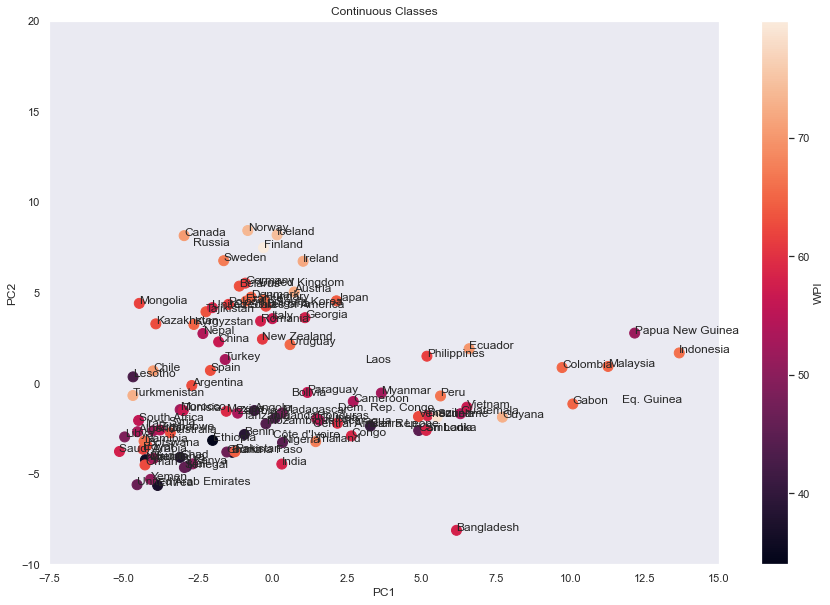

In [48]:
# Continuous classes PC1, PC2
plt.rcParams['figure.figsize'] = [15, 10]

plt_WPI_scatter_2050 = plt.scatter(np.array(merged_pca_df.PC1), np.array(merged_pca_df.PC2), c = np.array(merged_pca_df["WPI"]), s=100)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Continuous Classes")
plt.xlim([-7.5,15])
plt.ylim([-10,20])
plt.colorbar(label = "WPI")
plt.grid()

for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC1.loc[sample], merged_pca_df.PC2.loc[sample]))

plt.show()

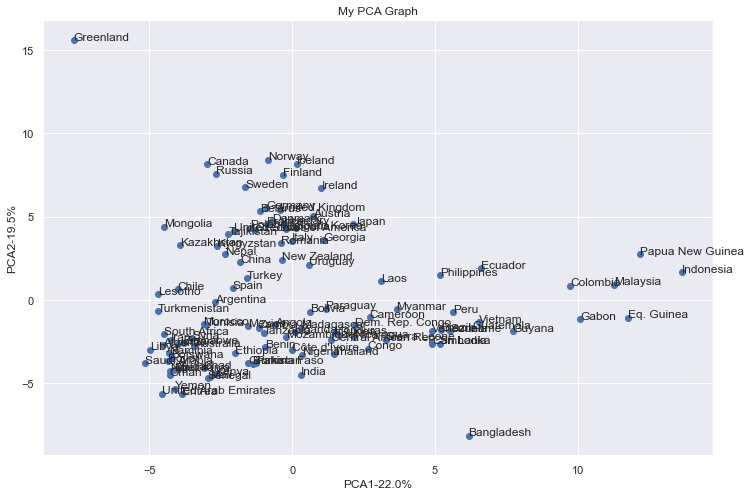

In [49]:
# Scatter plot PC1, PC2
plt.rcParams['figure.figsize'] = [12, 8]
plt_scatter_2050 = plt.scatter(pca_df.PC1, pca_df.PC2)
plt.title('My PCA Graph')
plt.xlabel('PCA1-{0}%'.format(per_var[0]))
plt.ylabel('PCA2-{0}%'.format(per_var[1]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))

plt.show()

# points that cluster together tend to be similar

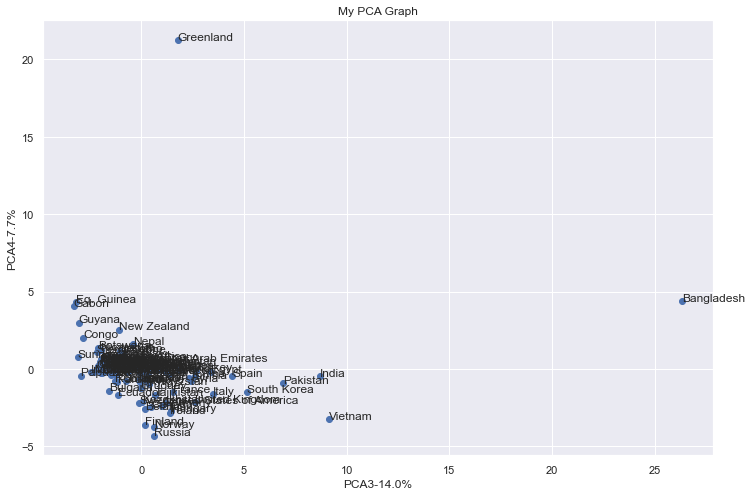

In [50]:
# Scatter plot PC3, PC4

plt.scatter(pca_df.PC3, pca_df.PC4)
plt.title('My PCA Graph')
plt.xlabel('PCA3-{0}%'.format(per_var[2]))
plt.ylabel('PCA4-{0}%'.format(per_var[3]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC3.loc[sample], pca_df.PC4.loc[sample]))

plt.show()

# points that cluster together tend to be similar

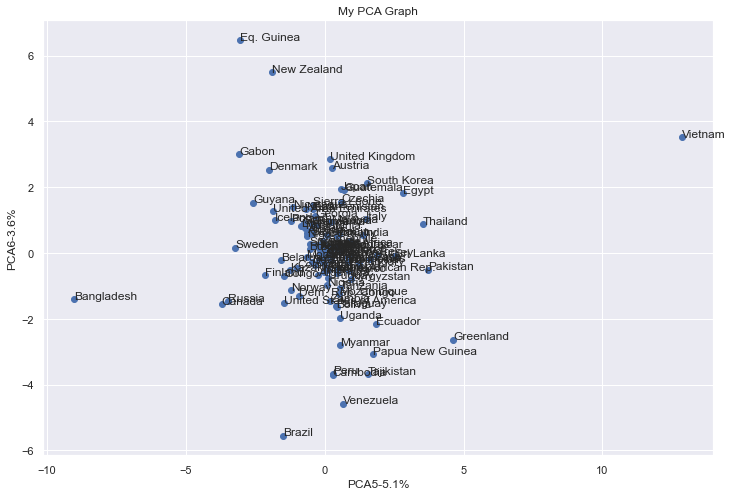

In [51]:
# Scatter plot PC5, PC6

plt.scatter(pca_df.PC5, pca_df.PC6)
plt.title('My PCA Graph')
plt.xlabel('PCA5-{0}%'.format(per_var[4]))
plt.ylabel('PCA6-{0}%'.format(per_var[5]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC5.loc[sample], pca_df.PC6.loc[sample]))

plt.show()

# points that cluster together tend to be similar

In [52]:
column_names=list(df2050_by_country2.iloc[:, 2:].columns)

In [53]:
# Which variable had the biggest effect on separating the observations? => Loading scores on PC1

loading_scores = pd.Series(pca.components_[0])
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_10_vars = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_vars])

13   0.22
6    0.22
62   0.22
68   0.22
67   0.22
34   0.22
65   0.22
4    0.22
66   0.21
77   0.21
dtype: float64


In [54]:
# Which variable had the biggest effect on separating the observations? => Loading scores on PC2

loading_scores = pd.Series(pca.components_[1])
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_10_vars = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_vars])

27   -0.24
28   -0.24
31   -0.24
32   -0.24
29   -0.24
2    -0.24
22   -0.24
36   -0.24
30   -0.24
61   -0.22
dtype: float64


### Correlation Plot

In [55]:
# Loadings Matrix

# component loadings or weights (correlation coefficient between original variables and the component) 
# component loadings represents the elements of the eigenvector
# the squared loadings within the PCs always sums to 1
loadings = pca_out.components_
loadings_abs= abs(pca_out.components_)
num_pc = pca_out.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_abs_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings_abs)))
dfxx = df_geo.drop(['lon', 'lat', 'geometry'], axis=1)
loadings_df['variable'] = dfxx.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2050_ACond_tavg,0.07,-0.03,-0.06,0.04,-0.14,-0.03,0.22,-0.28,-0.00,-0.04,0.16,-0.18,-0.10,0.29,-0.07,0.26,0.22,0.40,-0.11,0.07,0.04,-0.14,-0.03,-0.07,-0.10,-0.22,0.00,0.27,0.12,-0.07,0.00,0.20,-0.07,-0.15,-0.03,0.10,-0.01,-0.06,-0.07,-0.13,0.05,0.09,0.28,0.06,-0.06,0.08,-0.03,0.09,-0.01,-0.02,-0.04,0.02,0.02,0.00,-0.00,-0.01,-0.01,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00
2050_Albedo_inst,0.04,-0.10,-0.02,-0.33,-0.11,0.09,0.03,0.11,0.06,0.02,-0.01,0.00,0.05,0.07,0.02,-0.01,0.00,0.08,-0.08,0.00,-0.00,0.01,-0.01,-0.11,-0.04,-0.00,-0.02,-0.05,0.11,0.00,0.02,-0.05,0.09,-0.06,-0.01,-0.01,0.08,0.13,-0.09,-0.09,0.09,-0.15,-0.05,-0.27,0.08,-0.28,0.27,0.24,0.54,-0.12,-0.01,0.01,0.18,-0.19,0.19,0.06,0.02,-0.05,0.00,0.01,0.01,0.05,0.01,-0.01,-0.01,-0.01,0.01,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00
2050_AvgSurfT_inst,0.02,-0.24,-0.05,-0.02,0.03,0.02,-0.06,-0.00,0.01,-0.02,0.02,-0.02,0.03,-0.08,-0.07,-0.00,-0.03,0.00,0.02,0.02,-0.02,0.01,-0.05,-0.02,-0.05,-0.02,0.03,0.08,-0.02,-0.02,-0.04,-0.01,0.05,-0.02,-0.02,0.01,0.00,0.01,0.02,-0.00,0.01,-0.11,0.03,-0.08,-0.06,0.08,-0.02,-0.03,-0.07,-0.07,0.06,0.11,-0.07,0.05,0.03,0.29,0.28,0.29,-0.02,-0.03,-0.06,0.27,-0.07,-0.09,-0.06,0.69,0.13,0.02,-0.02,-0.01,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00
2050_CanopInt_inst,0.15,0.10,-0.02,-0.09,0.10,-0.02,-0.23,0.07,0.02,-0.05,-0.05,0.10,-0.06,-0.20,0.00,-0.09,-0.02,-0.02,-0.10,-0.10,0.08,-0.08,0.05,0.08,-0.02,-0.25,-0.08,-0.35,-0.34,-0.03,-0.21,0.27,0.00,-0.26,-0.21,-0.00,0.01,-0.11,-0.14,-0.00,-0.02,-0.05,0.40,0.04,-0.10,0.03,-0.03,0.16,0.03,-0.06,-0.07,0.01,0.07,-0.00,0.00,-0.01,-0.01,-0.00,0.02,0.01,0.00,0.00,0.01,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00
2050_ECanop_tavg,0.22,0.02,-0.07,0.02,-0.02,-0.00,0.02,-0.06,-0.02,0.01,-0.05,0.04,-0.02,0.01,-0.05,0.04,0.06,0.09,-0.09,-0.03,0.04,-0.01,-0.04,0.07,-0.14,-0.15,-0.04,0.07,-0.17,0.24,0.05,0.21,-0.03,-0.13,0.09,-0.42,-0.08,-0.22,-0.06,0.17,-0.15,0.14,-0.33,-0.36,0.07,-0.07,0.10,-0.12,-0.01,0.16,0.17,-0.10,-0.11,0.00,0.01,0.00,-0.01,0.06,-0.02,-0.02,0.10,0.02,0.02,-0.03,0.01,-0.00,-0.01,-0.00,0.00,-0.00,0.00,0.13,0.08,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
2050_ESoil_tavg,0.13,-0.06,0.06,-0.01,0.03,-0.08,0.05,-0.14,-0.19,0.26,-0.26,-0.12,0.19,0.20,0.03,-0.17,-0.04,-0.02,0.15,-0.00,-0.22,0.21,0.06,-0.01,0.26,0.12,-0.07,0.06,0.00,-0.04,-0.07,-0.02,0.06,0.08,-0.32,-0.15,-0.05,0.01,-0.28,-0.12,0.09,0.16,0.17,-0.03,0.03,0.10,0.03,0.12,-0.00,0.11,0.05,0.00,-0.05,0.02,0.01,-0.03,0.04,0.05,0.01,-0.03,0.17,0.05,0.04,-0.04,0.04,0.00,-0.02,-0.00,0.01,-0.00,0.00,0.20,0.12,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
2050_Evap_tavg,0.22,-0.01,-0.01,0.03,-0.01,0.03,0.06,-0.08,-0.09,0.08,-0.10,0.03,0.05,0.05,-0.02,-0.11,0.00,-0.05,0.03,0.04,0.02,0.07,0.07,0.06,-0.05,-0.08,-0.04,-0.04,0.11,0.03,-0.01,0.01,0.03,-0.05,0.06,0.06,-0.02,-0.02,0.02,0.01,-0.01,-0.06,0.01,0.02,-0.01,0.09,0.05,-0.01,0.04,0.10,0.13,-0.05,0.01,0.03,0.07,-0.01,0.04,-0.12,-0.00,0.06,-0.53,-0.10,-0.17,0.14,-0.12,0.03,0.05,0.08,0.61,0.16,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00
2050_LWdown_f_tavg,0.10,-0.21,-0.05,-0.02,0.03,0.01,-0.09,-0.08,0.02,-0.02,-0.00,0.05,0.08,-0.11,-0.07,0.01,0.06,0.01,0.07,0.03,-0.08,-0.11,-0.12,0.01,-0.00,-0.01,0.02,0.10,0.00,0.03,-0.01,-0.06,0.08,0.07,-0.00,-0.06,-0.06,-0.02,-0.06,0.09,-0.15,-0.08,0.07,0.05,-0.04,0.03,0.09,-0.01,0.03,-0.05,0.07,0.19,-0.01,0.14,-0.20,0.35,0.0

In [56]:
loadings_abs_df['variable'] = dfxx.columns.values
loadings_abs_df = loadings_abs_df.set_index('variable')
loadings_abs_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2050_ACond_tavg,0.07,0.03,0.06,0.04,0.14,0.03,0.22,0.28,0.00,0.04,0.16,0.18,0.10,0.29,0.07,0.26,0.22,0.40,0.11,0.07,0.04,0.14,0.03,0.07,0.10,0.22,0.00,0.27,0.12,0.07,0.00,0.20,0.07,0.15,0.03,0.10,0.01,0.06,0.07,0.13,0.05,0.09,0.28,0.06,0.06,0.08,0.03,0.09,0.01,0.02,0.04,0.02,0.02,0.00,0.00,0.01,0.01,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_Albedo_inst,0.04,0.10,0.02,0.33,0.11,0.09,0.03,0.11,0.06,0.02,0.01,0.00,0.05,0.07,0.02,0.01,0.00,0.08,0.08,0.00,0.00,0.01,0.01,0.11,0.04,0.00,0.02,0.05,0.11,0.00,0.02,0.05,0.09,0.06,0.01,0.01,0.08,0.13,0.09,0.09,0.09,0.15,0.05,0.27,0.08,0.28,0.27,0.24,0.54,0.12,0.01,0.01,0.18,0.19,0.19,0.06,0.02,0.05,0.00,0.01,0.01,0.05,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_AvgSurfT_inst,0.02,0.24,0.05,0.02,0.03,0.02,0.06,0.00,0.01,0.02,0.02,0.02,0.03,0.08,0.07,0.00,0.03,0.00,0.02,0.02,0.02,0.01,0.05,0.02,0.05,0.02,0.03,0.08,0.02,0.02,0.04,0.01,0.05,0.02,0.02,0.01,0.00,0.01,0.02,0.00,0.01,0.11,0.03,0.08,0.06,0.08,0.02,0.03,0.07,0.07,0.06,0.11,0.07,0.05,0.03,0.29,0.28,0.29,0.02,0.03,0.06,0.27,0.07,0.09,0.06,0.69,0.13,0.02,0.02,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_CanopInt_inst,0.15,0.10,0.02,0.09,0.10,0.02,0.23,0.07,0.02,0.05,0.05,0.10,0.06,0.20,0.00,0.09,0.02,0.02,0.10,0.10,0.08,0.08,0.05,0.08,0.02,0.25,0.08,0.35,0.34,0.03,0.21,0.27,0.00,0.26,0.21,0.00,0.01,0.11,0.14,0.00,0.02,0.05,0.40,0.04,0.10,0.03,0.03,0.16,0.03,0.06,0.07,0.01,0.07,0.00,0.00,0.01,0.01,0.00,0.02,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_ECanop_tavg,0.22,0.02,0.07,0.02,0.02,0.00,0.02,0.06,0.02,0.01,0.05,0.04,0.02,0.01,0.05,0.04,0.06,0.09,0.09,0.03,0.04,0.01,0.04,0.07,0.14,0.15,0.04,0.07,0.17,0.24,0.05,0.21,0.03,0.13,0.09,0.42,0.08,0.22,0.06,0.17,0.15,0.14,0.33,0.36,0.07,0.07,0.10,0.12,0.01,0.16,0.17,0.10,0.11,0.00,0.01,0.00,0.01,0.06,0.02,0.02,0.10,0.02,0.02,0.03,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.13,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [57]:
# Sorting loadings by PC1
loadings_sorted_df = loadings_df.sort_values("PC1")
loadings_sorted_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2050_Qh_tavg,-0.14,-0.13,-0.04,-0.00,0.08,-0.13,-0.07,0.15,0.01,0.06,0.13,-0.08,-0.21,0.18,0.08,0.10,0.11,0.12,-0.06,-0.17,-0.01,-0.09,-0.01,0.02,0.13,0.13,-0.09,-0.00,-0.18,0.19,0.04,-0.09,0.09,0.15,0.03,-0.13,-0.03,0.07,-0.06,0.08,-0.22,-0.22,0.02,0.09,-0.13,0.12,-0.02,0.07,0.02,-0.08,-0.16,-0.16,0.03,-0.04,0.03,0.01,-0.05,0.10,-0.01,-0.03,0.25,0.05,0.07,-0.05,0.05,0.02,-0.06,0.05,0.48,0.12,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00
2050_Wind_f_inst,-0.08,-0.06,-0.00,0.07,-0.07,-0.01,-0.00,-0.41,0.11,-0.22,0.11,-0.15,0.05,-0.13,0.17,-0.02,0.07,0.08,0.10,-0.14,0.06,0.06,0.39,-0.35,0.09,-0.08,-0.00,-0.25,0.03,0.20,-0.09,-0.25,0.14,-0.13,-0.13,-0.08,-0.13,0.02,0.13,0.13,0.14,0.02,-0.06,-0.10,-0.05,0.07,0.04,-0.03,-0.00,-0.02,-0.02,-0.05,0.02,0.02,-0.04,0.01,0.01,-0.02,0.01,-0.01,0.00,-0.00,-0.01,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00
2050_Qs_acc,-0.07,0.01,-0.02,-0.16,0.21,-0.29,-0.16,0.00,-0.05,-0.09,-0.13,0.14,-0.15,-0.14,0.11,-0.02,-0.04,0.22,-0.09,-0.23,0.10,-0.02,-0.08,-0.20,0.06,-0.22,0.12,0.11,-0.04,0.01,0.25,-0.10,-0.09,0.19,-0.09,0.16,0.12,0.08,0.01,-0.16,0.03,0.06,0.04,-0.01,0.06,0.15,0.17,-0.07,0.09,0.27,0.29,0.02,-0.14,0.05,0.06,-0.10,0.05,-0.03,-0.00,-0.01,-0.00,0.01,-0.01,0.01,-0.01,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
2050_qrswb,-0.06,-0.08,-0.02,0.00,0.04,-0.11,0.05,-0.02,0.02,-0.08,0.18,-0.19,0.28,-0.08,0.62,-0.36,0.06,-0.00,-0.22,0.19,0.25,-0.03,-0.22,0.11,0.05,0.02,-0.12,0.11,0.02,-0.06,0.02,0.10,0.09,-0.05,0.03,0.03,0.02,-0.06,-0.06,0.01,-0.07,0.02,-0.04,-0.00,-0.03,0.00,-0.01,0.01,-0.01,0.01,0.01,0.02,0.04,0.01,0.01,-0.01,0.01,0.01,-0.01,-0.05,-0.00,-0.02,-0.00,0.02,0.01,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.02,-0.02,0.00,-0.03,0.03,0.08,0.00
2050_Qsb_acc,-0.05,-0.03,0.02,-0.07,0.06,-0.30,-0.01,-0.23,-0.23,-0.23,0.01,0.12,0.03,0.07,0.04,0.28,-0.23,-0.11,-0.16,0.05,-0.21,0.12,-0.31,-0.11,-0.20,0.29,-0.15,-0.23,0.08,0.20,-0.08,0.19,0.18,-0.13,0.05,0.03,-0.02,0.04,0.01,-0.09,0.03,0.02,-0.03,0.12,0.01,0.05,0.00,-0.01,0.04,0.01,0.01,0.00,-0.01,-0.00,0.02,-0.01,0.00,-0.01,-0.00,-0.01,-0.00,-0.00,-0.01,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00


In [58]:
# Sorting abs() loadings by PC1
loadings_abs_sorted_df = loadings_abs_df.sort_values("PC1")
loadings_abs_sorted_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2050_locwetlandstor,0.00,0.06,0.00,0.07,0.11,0.14,0.16,0.07,0.03,0.14,0.05,0.01,0.39,0.22,0.30,0.02,0.45,0.36,0.23,0.06,0.23,0.06,0.10,0.05,0.23,0.01,0.14,0.14,0.10,0.03,0.10,0.01,0.04,0.08,0.08,0.02,0.02,0.07,0.01,0.08,0.03,0.00,0.09,0.07,0.01,0.01,0.01,0.01,0.02,0.02,0.00,0.01,0.01,0.01,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_canopystor,0.00,0.19,0.04,0.14,0.06,0.13,0.08,0.06,0.09,0.08,0.01,0.04,0.06,0.03,0.04,0.02,0.10,0.13,0.04,0.10,0.16,0.05,0.14,0.13,0.06,0.04,0.01,0.27,0.11,0.40,0.29,0.02,0.22,0.21,0.08,0.02,0.42,0.07,0.20,0.15,0.26,0.10,0.12,0.04,0.07,0.04,0.00,0.00,0.01,0.03,0.04,0.03,0.02,0.02,0.01,0.00,0.03,0.02,0.01,0.00,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_SoilTMP295_1295cm_inst,0.01,0.24,0.05,0.06,0.01,0.02,0.03,0.06,0.01,0.06,0.00,0.00,0.05,0.06,0.04,0.00,0.08,0.04,0.04,0.01,0.08,0.01,0.00,0.07,0.05,0.05,0.10,0.06,0.06,0.04,0.03,0.00,0.02,0.01,0.15,0.02,0.04,0.01,0.05,0.01,0.06,0.11,0.13,0.01,0.15,0.06,0.11,0.18,0.24,0.16,0.10,0.41,0.50,0.17,0.33,0.16,0.07,0.11,0.06,0.02,0.14,0.05,0.03,0.09,0.03,0.03,0.13,0.03,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2050_pnas,0.01,0.05,0.19,0.03,0.24,0.06,0.18,0.03,0.13,0.09,0.25,0.14,0.04,0.04,0.08,0.14,0.03,0.02,0.05,0.05,0.02,0.05,0.00,0.02,0.06,0.03,0.04,0.02,0.05,0.01,0.01,0.01,0.01,0.02,0.06,0.02,0.01,0.00,0.02,0.02,0.03,0.03,0.01,0.03,0.06,0.12,0.14,0.08,0.24,0.30,0.22,0.07,0.02,0.27,0.02,0.08,0.02,0.04,0.02,0.02,0.01,0.00,0.04,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.46,0.37,0.08,0.11,0.08,0.00,0.01
2050_reservoirstor,0.01,0.02,0.04,0.06,0.14,0.15,0.27,0.09,0.09,0.01,0.18,0.07,0.26,0.09,0.34,0.20,0.31,0.08,0.04,0.38,0.28,0.12,0.21,0.01,0.12,0.24,0.20,0.14,0.09,0.08,0.06,0.00,0.18,0.11,0.10,0.04,0.00,0.02,0.02,0.02,0.01,0.01,0.02,0.06,0.01,0.03,0.02,0.02,0.01,0.02,0.01,0.02,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01


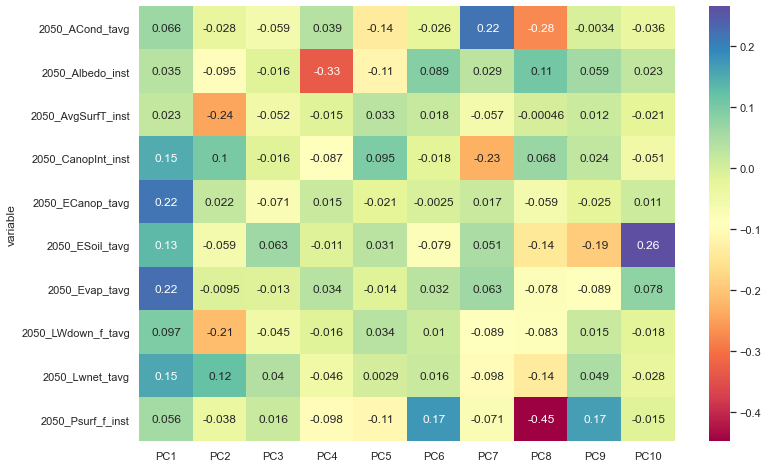

In [59]:
# positive and negative values in component loadings reflects the positive and negative 
# correlation of the variables with the PCs. Except A and B, all other variables have 
# positive projection on first PC.
plt.rcParams['figure.figsize'] = [12, 8]
# (First 10 variables on the first 10 PC's only, more cannot be visualized at once)
# get correlation matrix plot for loadings
ax = sns.heatmap(loadings_df.iloc[0:10, 0:10], annot=True, cmap='Spectral')
plt.show()

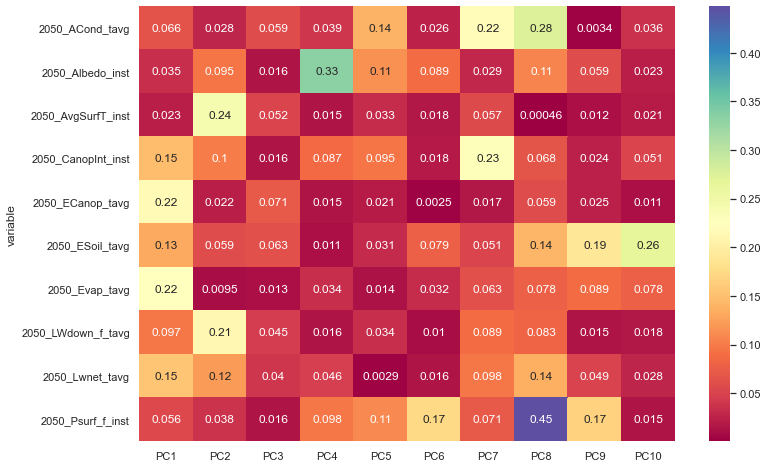

In [60]:
# get correlation matrix plot for abs() loadings
ax = sns.heatmap(loadings_abs_df.iloc[0:10, 0:10], annot=True, cmap='Spectral')
plt.show()

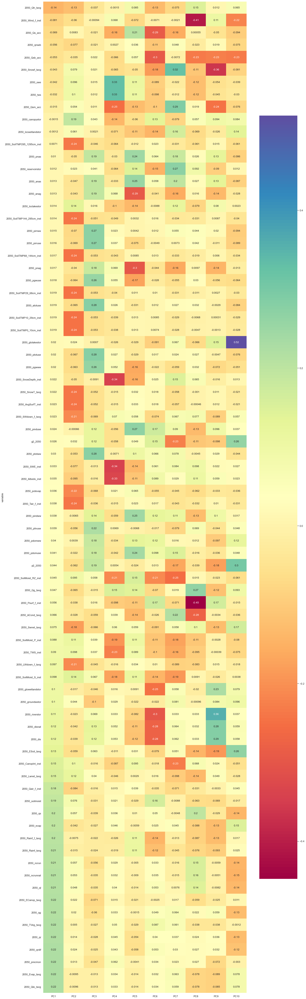

In [61]:
# on loadings_sorted_df 
# %matplotlib qt 
plt.rcParams['figure.figsize'] = [20, 80]
ax = sns.heatmap(loadings_sorted_df.iloc[0:, 0:10], annot=True, cmap='Spectral')
plt.show()

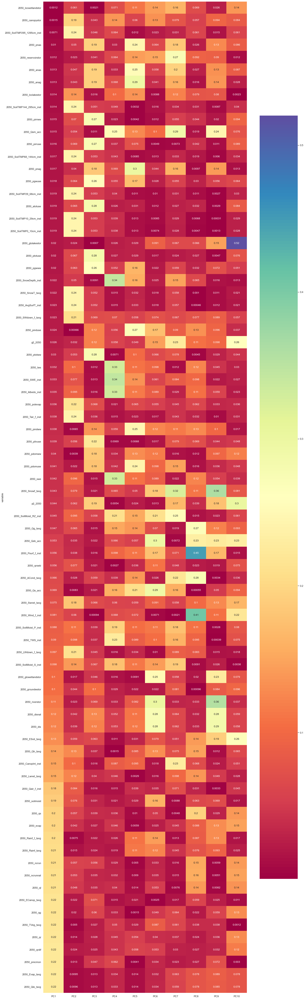

In [62]:
# on loadings_sorted_abs_df 
# %matplotlib qt 
plt.rcParams['figure.figsize'] = [20, 80]
ax = sns.heatmap(loadings_abs_sorted_df.iloc[0:, 0:10], annot=True, cmap='Spectral')
plt.show()

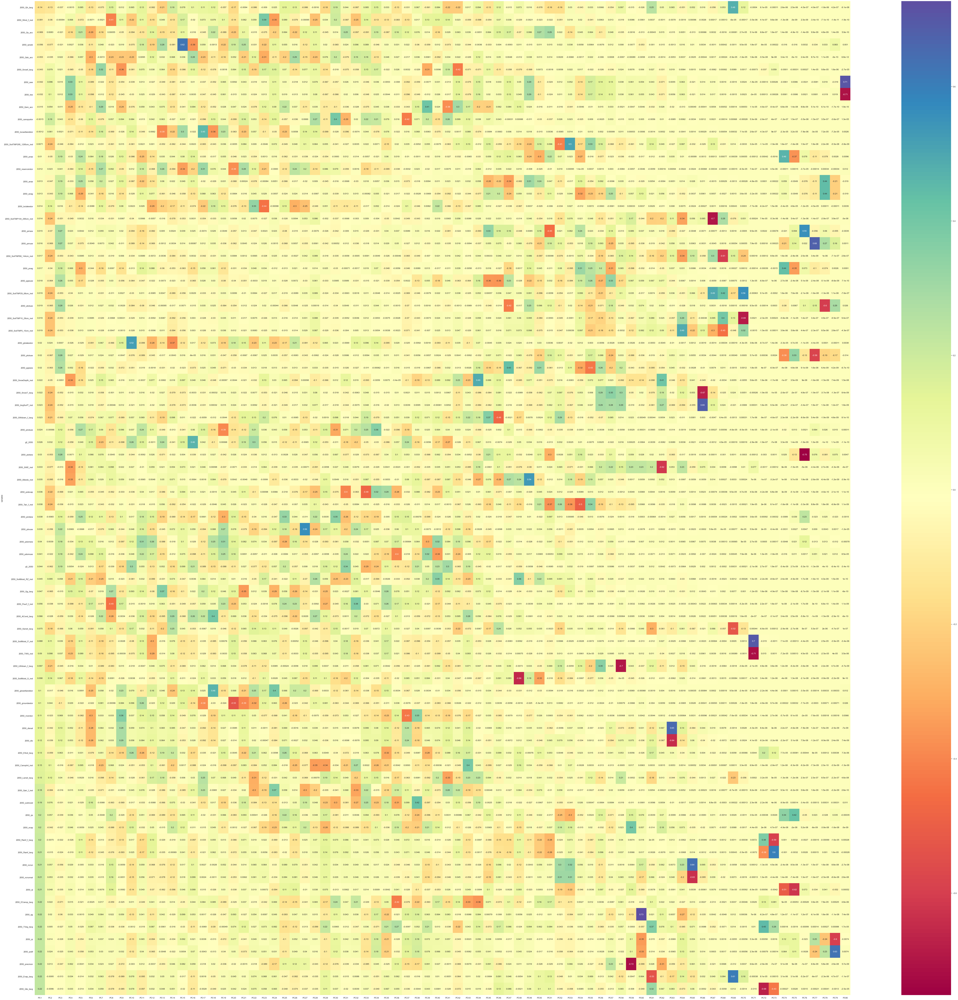

In [63]:
# all at once...
plt.rcParams['figure.figsize'] = [100, 100]
ax = sns.heatmap(loadings_sorted_df, annot=True, cmap='Spectral')
plt.show()

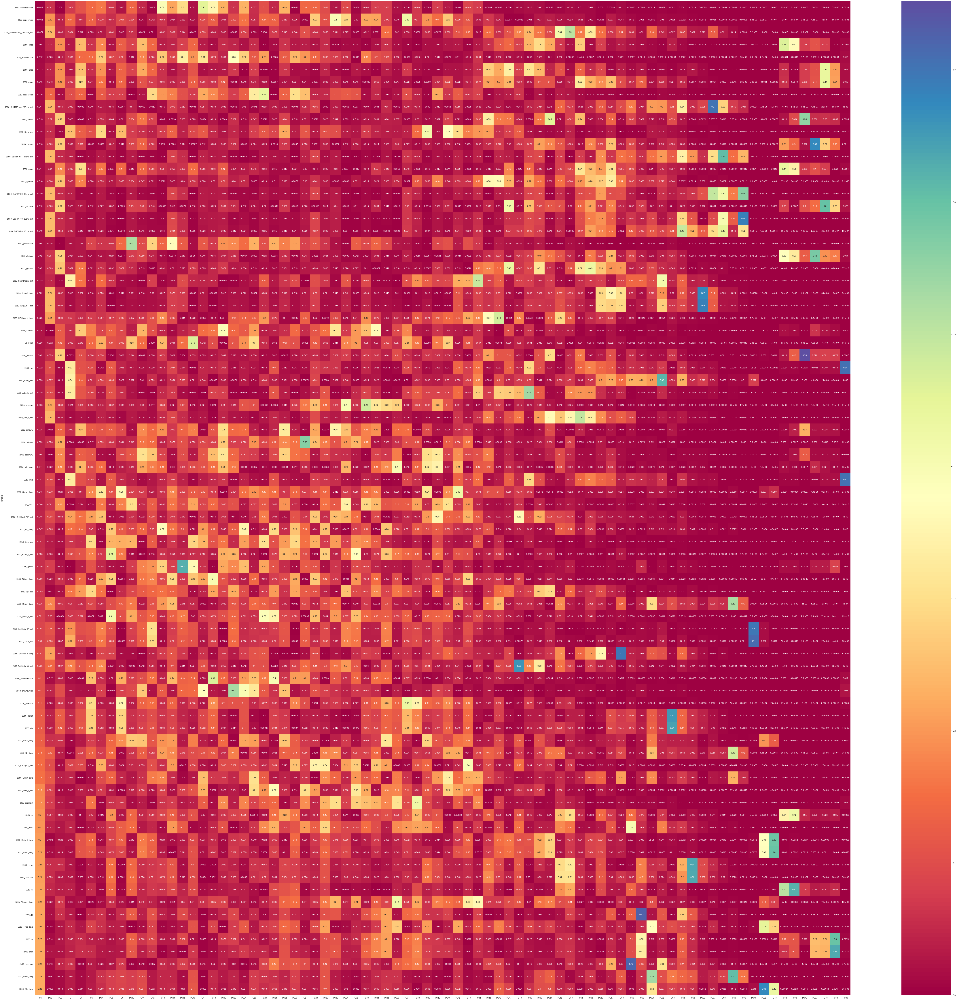

In [64]:
# all at once...ABS
plt.rcParams['figure.figsize'] = [100, 100]
ax = sns.heatmap(loadings_abs_sorted_df, annot=True, cmap='Spectral')
plt.show()

### Biplots

#### 2D

In [70]:
features = np.array(df_2050_pca.columns)
pca = PCA(n_components=2)
components = pca.fit_transform(scaled_data)

In [71]:
var = pca.explained_variance_ratio_.sum()
fig2D_2050 = px.scatter(components, x=0, y=1, text=merged_pca_df.index, color=merged_pca_df['WPI'],title=f'Total Explained Variance: {var}',
labels={'0':'PC1', '1':'PC2'})
for i, feature in enumerate(features):
    fig2D_2050.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig2D_2050.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig2D_2050.show()

#### 3D

In [72]:
# get 3D biplot
pca = PCA(n_components=3)
components = pca.fit_transform(scaled_data)

In [73]:
var = pca.explained_variance_ratio_.sum()
fig3D_2050 = px.scatter_3d(components, x=0, y=1, z=2, text=merged_pca_df.index, color=merged_pca_df['WPI'],title=f'Total Explained Variance: {var}',
labels={'0':'PC1', '1':'PC2', '2':'PC3'})
fig3D_2050.show()

# PCA 2002 on Data Grouped by Country Averages

In [74]:
# New df with variables relating to 2002 only + lon, lat, geometry
var_2050 = future_df.loc[:, future_df.columns.str.contains('2002')]
geom = master_df[['lon','lat','geometry']]
df_geo = pd.concat([geom, var_2050], axis=1)
df_geo = pd.DataFrame(df_geo)
df_geo.shape

(10880, 83)

In [75]:
# Treating missing values (-9999)

df_geo.replace(-9999, np.NaN, inplace = True)

In [76]:
print('Dimensions of the dataset:', df_geo.shape)
print('Dimensions after removing rows:', df_geo.dropna(axis=0).shape)

Dimensions of the dataset: (10880, 83)
Dimensions after removing rows: (10623, 83)


In [77]:
df_geo = df_geo.dropna(axis=0)

In [78]:
# Turning df_geo into GeoDataFrames from WKT format
gdf = geopandas.GeoDataFrame(df_geo, geometry='geometry')
print(gdf.head())

      lon   lat                     geometry  2002_ACond_tavg  \
0 -179.50 67.50  POINT (-179.50000 67.50000)             0.02   
1 -178.50 67.50  POINT (-178.50000 67.50000)             0.02   
2 -177.50 66.50  POINT (-177.50000 66.50000)             0.02   
3 -177.50 67.50  POINT (-177.50000 67.50000)             0.02   
4 -176.50 66.50  POINT (-176.50000 66.50000)             0.02   

   2002_Albedo_inst  2002_AvgSurfT_inst  2002_CanopInt_inst  2002_ECanop_tavg  \
0           -797.40              263.71                0.02              1.91   
1             40.63              263.83                0.02              1.73   
2             39.53              264.72                0.01              1.35   
3             40.28              264.61                0.02              2.17   
4             39.52              264.98                0.01              1.36   

   2002_ESoil_tavg  2002_Evap_tavg  2002_LWdown_f_tavg  2002_Lwnet_tavg  \
0            21.83            0.00             

In [79]:
df_geo

,lon,lat,geometry,2002_ACond_tavg,2002_Albedo_inst,2002_AvgSurfT_inst,2002_CanopInt_inst,2002_ECanop_tavg,2002_ESoil_tavg,2002_Evap_tavg,2002_LWdown_f_tavg,2002_Lwnet_tavg,2002_Psurf_f_inst,2002_Qair_f_inst,2002_Qg_tavg,2002_Qh_tavg,2002_Qle_tavg,2002_Qs_acc,2002_Qsb_acc,2002_Qsm_acc,2002_Rainf_f_tavg,2002_Rainf_tavg,2002_SWE_inst,2002_SWdown_f_tavg,2002_SnowDepth_inst,2002_SnowT_tavg,2002_Snowf_tavg,2002_SoilMoist_P_inst,2002_SoilMoist_RZ_inst,2002_SoilMoist_S_inst,2002_SoilTMP0_10cm_inst,2002_SoilTMP10_29cm_inst,2002_SoilTMP144_295cm_inst,2002_SoilTMP295_1295cm_inst,2002_SoilTMP29_68cm_inst,2002_SoilTMP68_144cm_inst,2002_Swnet_tavg,2002_TVeg_tavg,2002_TWS_inst,2002_Tair_f_inst,2002_Wind_f_inst,p2_2002,g2_2002,2002_anag,2002_anas,2002_atotuse,2002_canopystor,2002_dis,2002_evap,2002_glolakestor,2002_glowetlandstor,2002_groundwstor,2002_loclakestor,2002_locwetlandstor,2002_ncrun,2002_pdomuse,2002_pdomww,2002_pgwuse,2002_pgwww,2002_pinduse,2002_pindww,2002_pirruse,2002_pirrww,2002_plivuse,2002_pnag,2002_pnas,2002_potevap,2002_precmon,2002_ptotuse,2002_ptotww,2002_qg,2002_ql,2002_qr,2002_qrdif,2002_qrswb,2002_qs,2002_reservoirstor,2002_riverstor,2002_soilmoist,2002_swe,2002_tws,2002_disnat,2002_ncrunnat
0,-179.50,67.50,POINT (-179.50000 67.50000),0.02,-797.40,263.71,0.02,1.91,21.83,0.00,239.65,-37.82,"96,450.90",0.00,1.71,-4.77,27.71,0.12,0.00,0.18,0.00,0.00,146.50,96.61,0.53,263.71,0.00,"1,287.57",344.56,7.04,270.01,269.64,267.74,266.89,269.04,268.32,70.90,3.98,"1,434.08",265.09,5.28,0.00,0.00,0.00,0.00,0.00,0.10,30.03,-0.00,0.00,0.00,4.08,0.85,83.29,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.12,4.99,125.33,219.76,30.03,0.00
1,-178.50,67.50,POINT (-178.50000 67.50000),0.02,40.63,263.83,0.02,1.73,21.70,0.00,238.88,-39.18,"97,299.58",0.00,1.80,-6.76,27.44,0.14,0.00,0.18,0.00,0.00,157.78,96.18,0.56,263.83,0.00,"1,292.20",351.09,7.11,270.21,269.82,267.96,267.26,269.22,268.49,69.54,4.01,"1,450.00",265.29,5.30,0.00,0.00,0.00,0.00,0.00,0.09,158.14,-0.00,0.00,0.00,3.99,15.61,87.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,17.73,6.84,109.87,241.76,158.14,0.00
2,-177.50,66.50,POINT (-177.50000 66.50000),0.02,39.53,264.72,0.01,1.35,21.36,0.00,244.68,-35.66,"96,984.73",0.00,1.34,-5.73,25.08,0.13,0.00,0.17,0.00,0.00,146.03,89.77,0.52,264.73,0.00,"1,319.86",364.51,7.21,270.75,270.42,269.06,268.74,269.92,269.33,65.07,2.37,"1,465.91",265.75,5.97,0.00,0.00,0.00,0.00,0.00,0.12,20.04,0.00,0.00,0.00,1.79,0.24,7.48,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.89,11.31,112.13,133.96,20.04,0.00
3,-177.50,67.50,POINT (-177.50000 67.50000),0.02,40.28,264.61,0.02,2.17,22.54,0.00,242.89,-37.83,"98,848.27",0.00,1.91,-5.96,28.40,0.11,0.00,0.14,0.00,0.00,121.14,93.68,0.45,264.62,0.00,"1,291.30",353.75,7.10,270.26,269.86,268.03,267.68,269.24,268.48,68.68,3.69,"1,412.46",265.84,5.41,0.00,0.00,0.00,0.00,0.00,0.08,78.69,0.00,0.00,0.00,2.76,10.54,14.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.55,10.89,98.26,142.97,78.69,0.00
4,-176.50,66.50,POINT (-176.50000 66.50000),0.02,39.52,264.98,0.01,1.36,21.83,0.00,244.24,-37.26,"97,825.98",0.00,1.58,-6.89,25.81,0.12,0.00,0.15,0.00,0.00,131.75,89.59,0.48,264.99,0.00,"1,324.36",366.20,7.23,270.54,270.19,268.75,268.76,269.64,268.99,65.13,2.63,"1,456.12",266.14,5.95,0.00,0.00,0.00,0.00,0.00,0.10,17.51,0.00,0.00,0.00,1.82,1.58,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.75,11.06,89.31,105.61,17.51,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [80]:
# Spatial join

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
cities = geopandas.read_file(geopandas.datasets.get_path('naturalearth_cities'))
countries = world[['geometry', 'name']]
countries = countries.rename(columns={'name':'country'})

df_2002 = geopandas.sjoin(gdf, countries, how="inner", op='intersects')
df_2002.sample(10)

,lon,lat,geometry,2002_ACond_tavg,2002_Albedo_inst,2002_AvgSurfT_inst,2002_CanopInt_inst,2002_ECanop_tavg,2002_ESoil_tavg,2002_Evap_tavg,2002_LWdown_f_tavg,2002_Lwnet_tavg,2002_Psurf_f_inst,2002_Qair_f_inst,2002_Qg_tavg,2002_Qh_tavg,2002_Qle_tavg,2002_Qs_acc,2002_Qsb_acc,2002_Qsm_acc,2002_Rainf_f_tavg,2002_Rainf_tavg,2002_SWE_inst,2002_SWdown_f_tavg,2002_SnowDepth_inst,2002_SnowT_tavg,2002_Snowf_tavg,2002_SoilMoist_P_inst,2002_SoilMoist_RZ_inst,2002_SoilMoist_S_inst,2002_SoilTMP0_10cm_inst,2002_SoilTMP10_29cm_inst,2002_SoilTMP144_295cm_inst,2002_SoilTMP295_1295cm_inst,2002_SoilTMP29_68cm_inst,2002_SoilTMP68_144cm_inst,2002_Swnet_tavg,2002_TVeg_tavg,2002_TWS_inst,2002_Tair_f_inst,2002_Wind_f_inst,p2_2002,g2_2002,2002_anag,2002_anas,2002_atotuse,2002_canopystor,2002_dis,2002_evap,2002_glolakestor,2002_glowetlandstor,2002_groundwstor,2002_loclakestor,2002_locwetlandstor,2002_ncrun,2002_pdomuse,2002_pdomww,2002_pgwuse,2002_pgwww,2002_pinduse,2002_pindww,2002_pirruse,2002_pirrww,2002_plivuse,2002_pnag,2002_pnas,2002_potevap,2002_precmon,2002_ptotuse,2002_ptotww,2002_qg,2002_ql,2002_qr,2002_qrdif,2002_qrswb,2002_qs,2002_reservoirstor,2002_riverstor,2002_soilmoist,2002_swe,2002_tws,2002_disnat,2002_ncrunnat,index_right,country
3836,-7.50,20.50,POINT (-7.50000 20.50000),0.01,44.50,302.79,0.00,0.17,1.60,0.00,366.22,-90.20,"97,755.21",0.00,-0.30,56.87,1.91,0.00,0.00,0.00,0.00,0.00,0.00,254.31,0.00,302.84,0.00,121.63,34.16,0.41,302.86,302.91,303.41,304.11,303.00,303.16,148.68,0.15,121.63,299.97,4.48,0.00,0.00,0.00,0.00,0.00,0.00,10.19,0.00,0.00,0.00,2.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.19,0.05,0.00,4.30,10.21,0.00,53,Mauritania
2887,-55.50,-32.50,POINT (-55.50000 -32.50000),0.02,18.71,290.42,0.04,8.00,59.04,0.00,352.20,-47.63,"100,632.30",0.01,-0.11,-11.43,117.06,0.21,0.00,0.00,0.00,0.00,0.00,183.95,0.00,290.46,0.00,"2,021.16",355.26,7.10,290.42,290.44,290.58,290.74,290.47,290.51,153.15,50.02,"2,021.20",291.52,3.90,0.00,0.01,-0.00,0.00,0.00,0.04,567.49,0.00,0.00,14.77,69.77,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,44.65,113.79,0.00,243.03,570.07,0.00,28,Uruguay
827,-110.50,46.50,POINT (-110.50000 46.50000),0.15,16.82,276.04,0.01,6.16,11.85,0.00,269.43,-57.34,"82,269.21",0.00,-0.18,55.47,24.68,0.01,0.00,0.02,0.00,0.00,1.74,167.33,0.01,276.05,0.00,793.34,189.25,3.88,276.00,275.78,276.05,277.34,275.54,275.56,142.26,6.67,795.10,275.78,4.18,0.01,0.15,-0.00,0.00,0.00,0.12,5.97,0.00,0.00,0.00,13.24,5.25,21.45,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.31,56.54,7.77,104.68,6.77,0.00,4,United States of America
5471,31.50,64.50,POINT (31.50000 64.50000),0.09,27.92,273.65,0.05,6.64,19.95,0.00,272.15,-46.91,"99,277.68",0.00,-0.13,-8.95,43.87,0.05,0.00,0.10,0.00,0.00,58.25,106.21,0.21,273.65,0.00,"1,945.15",242.29,5.13,276.48,276.32,275.72,274.48,276.13,275.97,88.59,17.28,"2,003.44",274.21,3.14,0.01,0.02,0.00,0.00,0.00,0.07,42.80,0.00,152.98,0.00,29.67,123.86,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.74,34.18,36.41,384.91,42.81,0.00,18,Russia
8727,106.50,48.50,POINT (106.50000 48.50000),0.02,24.40,273.54,0.01,4.44,12.10,0.00,262.43,-54.98,"86,999.61",0.00,-0.09,49.18,16.57,0.00,0.00,0.01,0.00,0.00,4.85,151.35,0.03,273.56,0.00,716.94,213.83,4.03,274.43,274.07,272.68,273.16,273.53,272.89,122.09,0.02,721.81,272.65,3.65,0.04,0.09,-0.00,0.00,0.00,0.11,0.74,0.00,0.00,0.00,0.27,-0.62,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.12,4.53,5.35,9.77,0.89,0.00,97,Mongolia
8820,108.50,37.50,POINT (108.50000 37.50000),0.02,22.47,283.40,0.00,1.38,27.60,0.00,291.04,-64.19,"85,704.98",0.00,0.08,49.11,29.28,0.01,0.00,0.00,0.00,0.00,0.43,181.00,0.00,283.41,0.00,"1

In [81]:
df_group = df_2002.groupby('country')
df_group.size()

country
Algeria                      172
Angola                        72
Argentina                    206
Australia                    596
Austria                        2
Bangladesh                     2
Belarus                       15
Benin                          1
Bolivia                       66
Botswana                      30
Brazil                       606
Bulgaria                       3
Burkina Faso                   9
Cambodia                       6
Cameroon                      18
Canada                      1103
Central African Rep.          29
Chad                          81
Chile                         16
China                        817
Colombia                      66
Congo                          9
Czechia                        1
Côte d'Ivoire                 14
Dem. Rep. Congo              147
Denmark                        1
Ecuador                        9
Egypt                         63
Eq. Guinea                     1
Eritrea                        3
Et

In [82]:
df2002_by_country = df_group.mean()

In [83]:
df2002_by_country2 = df2002_by_country.iloc[:,2:]
df2002_by_country2.head()

,2002_ACond_tavg,2002_Albedo_inst,2002_AvgSurfT_inst,2002_CanopInt_inst,2002_ECanop_tavg,2002_ESoil_tavg,2002_Evap_tavg,2002_LWdown_f_tavg,2002_Lwnet_tavg,2002_Psurf_f_inst,2002_Qair_f_inst,2002_Qg_tavg,2002_Qh_tavg,2002_Qle_tavg,2002_Qs_acc,2002_Qsb_acc,2002_Qsm_acc,2002_Rainf_f_tavg,2002_Rainf_tavg,2002_SWE_inst,2002_SWdown_f_tavg,2002_SnowDepth_inst,2002_SnowT_tavg,2002_Snowf_tavg,2002_SoilMoist_P_inst,2002_SoilMoist_RZ_inst,2002_SoilMoist_S_inst,2002_SoilTMP0_10cm_inst,2002_SoilTMP10_29cm_inst,2002_SoilTMP144_295cm_inst,2002_SoilTMP295_1295cm_inst,2002_SoilTMP29_68cm_inst,2002_SoilTMP68_144cm_inst,2002_Swnet_tavg,2002_TVeg_tavg,2002_TWS_inst,2002_Tair_f_inst,2002_Wind_f_inst,p2_2002,g2_2002,2002_anag,2002_anas,2002_atotuse,2002_canopystor,2002_dis,2002_evap,2002_glolakestor,2002_glowetlandstor,2002_groundwstor,2002_loclakestor,2002_locwetlandstor,2002_ncrun,2002_pdomuse,2002_pdomww,2002_pgwuse,2002_pgwww,2002_pinduse,2002_pindww,2002_pirruse,2002_pirrww,2002_plivuse,2002_pnag,2002_pnas,2002_potevap,2002_precmon,2002_ptotuse,2002_ptotww,2002_qg,2002_ql,2002_qr,2002_qrdif,2002_qrswb,2002_qs,2002_reservoirstor,2002_riverstor,2002_soilmoist,2002_swe,2002_tws,2002_disnat,2002_ncrunnat,index_right
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Algeria,0.01,37.49,298.62,0.00,0.29,4.85,0.00,342.96,-90.92,"95,056.80",0.00,-0.10,58.29,5.28,0.00,0.00,0.00,0.00,0.00,0.00,238.27,0.00,298.67,0.00,457.69,125.43,1.17,298.67,298.69,298.92,299.12,298.72,298.79,154.39,0.14,457.69,295.36,3.55,0.01,0.05,0.00,0.00,0.00,0.00,9.21,0.00,-0.55,0.83,-11.96,-0.28,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.91,0.61,0.00,-10.40,9.40,0.00,82
Angola,0.02,14.80,295.30,0.07,11.75,30.30,0.00,358.92,-65.61,"88,644.58",0.01,-0.24,58.99,76.24,0.02,0.00,0.00,0.00,0.00,0.00,230.75,0.00,295.31,0.00,999.58,188.80,3.86,295.30,295.34,295.77,296.56,295.41,295.54,200.60,34.18,999.65,293.78,1.99,0.02,0.05,-0.00,0.00,0.00,0.00,78.98,0.00,0.00,12.04,36.12,-0.45,6.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.09,5.65,36.53,0.00,97.00,79.02,0.00,74
Argentina,0.03,15.86,288.99,0.02,4.08,35.89,0.00,325.84,-62.38,"94,466.12",0.01,-0.25,56.21,51.22,0.06,0.00,0.00,0.00,0.00,0.30,198.53,0.00,288.99,0.00,924.84,215.03,4.28,288.99,289.02,289.29,289.83,289.08,289.17,169.83,11.25,925.15,287.63,4.23,0.02,0.23,-0.00,0.00,0.00,0.03,469.40,0.00,-2.39,41.26,24.75,3.00,6.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.11,25.44,42.31,0.46,157.30,480.81,0.00,9
Australia,0.02,19.14,297.36,0.00,1.54,18.98,0.00,346.20,-85.69,"97,869.77",0.01,0.15,83.63,24.31,0.01,0.00,0.00,0.00,0.00,0.00,234.22,0.00,297.40,0.00,594.87,156.79,2.31,297.36,297.33,297.04,297.33,297.26,297.15,193.78,3.80,594.87,294.84,3.71,0.00,0.04,-0.00,0.00,0.00,0.01,30.17,0.00,0.18,2.08,6.95,-1.35,0.17,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.25,2.66,7.14,0.00,20.10,31.12,0.00,137
Austria,0.14,14.41,279.59,0.05,11.32,27.90,0.00,302.39,-40.30,"90,787.87",0.01,0.67,9.74,57.92,0.10,0.03,0.04,0.00,0.00,4.02,129.04,0.02,279.59,0.00,"1,204.72",305.37,6.37,279.78,279.62,279.25,279.03,279.45,279.35,112.81,18.70,"1,208.80",279.67,3.19,0.07,1.89,0.00,-0.00,0.00,0.34,93.53,0.00,0.00,0.00,33.68,0.20,0.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.98,201.74,26.47,265.58,93.55,0.00,114


In [84]:
# PCA on df_2002 by country
# Removing lon, lat (non-numeric) data

df_2002_pca = df2002_by_country2.drop('index_right', axis=1)
df_2002_pca.sample()

,2002_ACond_tavg,2002_Albedo_inst,2002_AvgSurfT_inst,2002_CanopInt_inst,2002_ECanop_tavg,2002_ESoil_tavg,2002_Evap_tavg,2002_LWdown_f_tavg,2002_Lwnet_tavg,2002_Psurf_f_inst,2002_Qair_f_inst,2002_Qg_tavg,2002_Qh_tavg,2002_Qle_tavg,2002_Qs_acc,2002_Qsb_acc,2002_Qsm_acc,2002_Rainf_f_tavg,2002_Rainf_tavg,2002_SWE_inst,2002_SWdown_f_tavg,2002_SnowDepth_inst,2002_SnowT_tavg,2002_Snowf_tavg,2002_SoilMoist_P_inst,2002_SoilMoist_RZ_inst,2002_SoilMoist_S_inst,2002_SoilTMP0_10cm_inst,2002_SoilTMP10_29cm_inst,2002_SoilTMP144_295cm_inst,2002_SoilTMP295_1295cm_inst,2002_SoilTMP29_68cm_inst,2002_SoilTMP68_144cm_inst,2002_Swnet_tavg,2002_TVeg_tavg,2002_TWS_inst,2002_Tair_f_inst,2002_Wind_f_inst,p2_2002,g2_2002,2002_anag,2002_anas,2002_atotuse,2002_canopystor,2002_dis,2002_evap,2002_glolakestor,2002_glowetlandstor,2002_groundwstor,2002_loclakestor,2002_locwetlandstor,2002_ncrun,2002_pdomuse,2002_pdomww,2002_pgwuse,2002_pgwww,2002_pinduse,2002_pindww,2002_pirruse,2002_pirrww,2002_plivuse,2002_pnag,2002_pnas,2002_potevap,2002_precmon,2002_ptotuse,2002_ptotww,2002_qg,2002_ql,2002_qr,2002_qrdif,2002_qrswb,2002_qs,2002_reservoirstor,2002_riverstor,2002_soilmoist,2002_swe,2002_tws,2002_disnat,2002_ncrunnat
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Algeria,0.01,37.49,298.62,0.00,0.29,4.85,0.00,342.96,-90.92,"95,056.80",0.00,-0.10,58.29,5.28,0.00,0.00,0.00,0.00,0.00,0.00,238.27,0.00,298.67,0.00,457.69,125.43,1.17,298.67,298.69,298.92,299.12,298.72,298.79,154.39,0.14,457.69,295.36,3.55,0.01,0.05,0.00,0.00,0.00,0.00,9.21,0.00,-0.55,0.83,-11.96,-0.28,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.91,0.61,0.00,-10.40,9.40,0.00


In [85]:
# Scaling and centering the data
scaled_data = preprocessing.scale(df_2002_pca)
# PCA
pca = PCA()
pca_out = pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

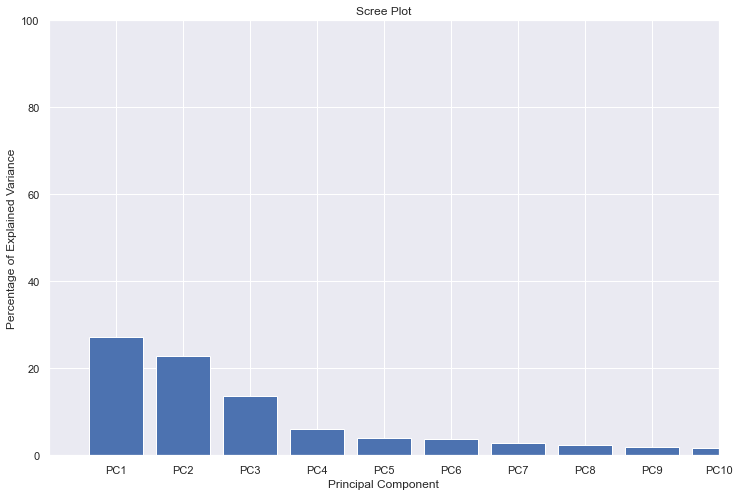

In [86]:
# Scree plot
plt.rcParams['figure.figsize'] = [12, 8]
# % of variation each PC accounts for:
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels =['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.ylim([0,100])
plt.xlim([0,10])
plt.show()


In [87]:
# Creating a PC plot
# First we put the new coordinates created by pca.transform(scaled.data) into a nice matrix, where the rows have sample labels and the columns have PC labels
pca_df = pd.DataFrame(pca_data, columns=labels)
pca_df["country"] = df2002_by_country2.index # adding back geometric locations
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,country
0,-5.71,-3.14,-1.20,-0.28,1.28,0.18,1.21,-1.23,0.76,-0.41,0.02,0.36,0.64,0.63,0.41,0.03,0.08,-0.07,-0.16,-0.12,0.03,-0.01,-0.14,0.23,-0.02,0.16,-0.07,-0.07,0.32,0.15,-0.32,0.09,0.03,0.08,0.04,0.06,0.12,-0.09,0.13,-0.14,-0.16,0.04,0.10,0.03,0.03,0.00,0.00,0.00,-0.02,-0.04,-0.02,-0.01,-0.03,-0.07,0.00,-0.03,0.00,0.01,-0.01,-0.01,-0.00,0.00,-0.00,-0.01,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,Algeria
1,-0.51,-2.68,-1.86,0.32,0.11,0.60,-0.63,1.24,-0.65,0.10,0.26,0.06,0.01,-0.55,0.27,0.19,-0.29,0.00,0.01,-0.87,0.48,-0.13,-0.48,-0.03,-0.51,0.01,0.31,-0.27,-0.15,0.16,-0.22,-0.01,-0.01,0.00,0.02,0.32,-0.14,-0.05,-0.02,0.14,0.04,0.01,0.08,0.00,-0.01,0.06,-0.02,-0.02,-0.03,0.02,0.00,0.03,-0.01,-0.06,0.03,-0.03,0.02,0.00,-0.02,-0.01,-0.01,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,Angola
2,-2.22,-0.22,-0.84,0.20,0.66,-0.17,-0.78,1.10,0.56,0.30,0.39,-1.01,-1.51,0.18,0.09,0.16,0.19,-0.46,0.57,-0.04,0.24,-0.09,0.91,-0.14,0.58,-0.23,-0.26,-0.63,-0.28,-0.03,0.18,0.12,0.05,-0.04,-0.12,-0.10,-0.04,0.06,0.05,0.06,-0.07,0.01,-0.03,0.10,-0.09,-0.01,-0.11,-0.01,0.06,-0.02,0.03,-0.06,-0.02,-0.02,-0.01,0.02,0.02,-0.03,0.02,-0.01,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,Argentina
3,-4.54,-3.28,-1.04,-0.26,0.70,0.29,0.68,-0.43,0.24,-0.51,-0.51,0.18,-0.17,0.10,-0.37,-0.28,-0.11,0.03,-0.50,0.47,0.22,0.57,0.29,0.16,0.06,-0.68,-0.24,-0.08,-0.49,-0.20,0.42,0.22,-0.31,-0.15,0.13,-0.22,-0.25,-0.08,-0.12,0.05,0.02,-0.05,0.25,0.07,0.02,-0.09,-0.03,0.01,0.08,0.00,-0.03,0.00,-0.06,-0.04,0.02,0.00,0.02,0.04,0.00,-0.01,0.00,-0.01,0.01,0.02,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,Australia
4,1.16,6.23,-0.45,-2.50,1.36,-0.95,1.04,0.02,-0.31,-2.38,-2.14,-0.20,0.30,-1.64,-1.69,0.40,-0.12,-1.38,0.87,1.42,0.59,0.19,0.39,0.11,-1.15,0.93,0.46,0.37,0.08,-0.39,0.05,-0.15,-0.19,0.10,-0.33,-0.32,0.29,0.12,-0.21,-0.08,0.04,0.06,-0.06,0.09,0.05,0.00,0.01,-0.07,-0.10,0.01,-0.01,-0.10,0.09,0.00,0.01,-0.03,-0.00,-0.00,-0.01,0.00,0.01,-0.01,0.00,0.00,0.01,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,Austria


In [88]:
pca_df = pca_df.set_index("country")

## Scatter Plots

In [89]:
# Importing World Poverty Index document. We will colour the data points as per the level of their poverty index

wpif = pd.read_csv("data/wpif.csv")
wpif.head()

,FID,the_geom,OBJECTID,ISO,NAME,UNESCOMEMB,WPI
0,wpif.1,MULTIPOLYGON (((32.99153110000003 -25.97011939...,170,MOZ,Mozambique,Mozambique,44.00
1,wpif.2,MULTIPOLYGON (((57.33786440000006 -20.47313479...,160,MUS,Mauritius,Mauritius,57.70
2,wpif.3,MULTIPOLYGON (((34.67768591300006 -12.07570416...,152,MWI,Malawi,Malawi,38.00
3,wpif.4,MULTIPOLYGON (((30.473515106000036 -1.05741077...,205,RWA,Rwanda,Rwanda,42.00
4,wpif.5,MULTIPOLYGON (((41.93258140000006 -1.156083599...,226,SOM,Somalia,Somalia,-999.00


In [90]:
wpif.shape

(220, 7)

In [91]:
pca_df.shape

(109, 80)

In [92]:
WPI = wpif[['NAME', 'WPI']]
WPI = WPI.rename(columns={'NAME':'country'})
WPI

,country,WPI
0,Mozambique,44.00
1,Mauritius,57.70
2,Malawi,38.00
3,Rwanda,42.00
4,Somalia,-999.00
5,Zambia,53.50
6,Kenya,49.80
7,Madagascar,47.80
8,South Sudan,-999.00
9,Seychelles,-999.00


In [93]:
WPI.replace(-999, np.NaN, inplace = True)

In [94]:
print('Dimensions of the dataset:', WPI.shape)
print('Dimensions after removing rows:', WPI.dropna(axis=0).shape)

Dimensions of the dataset: (220, 2)
Dimensions after removing rows: (141, 2)


In [95]:
WPI = WPI.dropna(axis=0)

In [96]:
# Merge pca_df with WPI based on 'country'

merged_pca_df = pd.merge(left=pca_df, right=WPI, how='left', left_on='country', right_on='country')
merged_pca_df

,country,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,WPI
0,Algeria,-5.71,-3.14,-1.20,-0.28,1.28,0.18,1.21,-1.23,0.76,-0.41,0.02,0.36,0.64,0.63,0.41,0.03,0.08,-0.07,-0.16,-0.12,0.03,-0.01,-0.14,0.23,-0.02,0.16,-0.07,-0.07,0.32,0.15,-0.32,0.09,0.03,0.08,0.04,0.06,0.12,-0.09,0.13,-0.14,-0.16,0.04,0.10,0.03,0.03,0.00,0.00,0.00,-0.02,-0.04,-0.02,-0.01,-0.03,-0.07,0.00,-0.03,0.00,0.01,-0.01,-0.01,-0.00,0.00,-0.00,-0.01,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,53.40
1,Angola,-0.51,-2.68,-1.86,0.32,0.11,0.60,-0.63,1.24,-0.65,0.10,0.26,0.06,0.01,-0.55,0.27,0.19,-0.29,0.00,0.01,-0.87,0.48,-0.13,-0.48,-0.03,-0.51,0.01,0.31,-0.27,-0.15,0.16,-0.22,-0.01,-0.01,0.00,0.02,0.32,-0.14,-0.05,-0.02,0.14,0.04,0.01,0.08,0.00,-0.01,0.06,-0.02,-0.02,-0.03,0.02,0.00,0.03,-0.01,-0.06,0.03,-0.03,0.02,0.00,-0.02,-0.01,-0.01,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,41.70
2,Argentina,-2.22,-0.22,-0.84,0.20,0.66,-0.17,-0.78,1.10,0.56,0.30,0.39,-1.01,-1.51,0.18,0.09,0.16,0.19,-0.46,0.57,-0.04,0.24,-0.09,0.91,-0.14,0.58,-0.23,-0.26,-0.63,-0.28,-0.03,0.18,0.12,0.05,-0.04,-0.12,-0.10,-0.04,0.06,0.05,0.06,-0.07,0.01,-0.03,0.10,-0.09,-0.01,-0.11,-0.01,0.06,-0.02,0.03,-0.06,-0.02,-0.02,-0.01,0.02,0.02,-0.03,0.02,-0.01,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,62.80
3,Australia,-4.54,-3.28,-1.04,-0.26,0.70,0.29,0.68,-0.43,0.24,-0.51,-0.51,0.18,-0.17,0.10,-0.37,-0.28,-0.11,0.03,-0.50,0.47,0.22,0.57,0.29,0.16,0.06,-0.68,-0.24,-0.08,-0.49,-0.20,0.42,0.22,-0.31,-0.15,0.13,-0.22,-0.25,-0.08,-0.12,0.05,0.02,-0.05,0.25,0.07,0.02,-0.09,-0.03,0.01,0.08,0.00,-0.03,0.00,-0.06,-0.04,0.02,0.00,0.02,0.04,0.00,-0.01,0.00,-0.01,0.01,0.02,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,63.30
4,Austria,1.16,6.23,-0.45,-2.50,1.36,-0.95,1.04,0.02,-0.31,-2.38,-2.14,-0.20,0.30,-1.64,-1.69,0.40,-0.12,-1.38,0.87,1.42,0.59,0.19,0.39,0.11,-1.15,0.93,0.46,0.37,0.08,-0.39,0.05,-0.15,-0.19,0.10,-0.33,-0.32,0.29,0.12,-0.21,-0.08,0.04,0.06,-0.06,0.09,0.05,0.00,0.01,-0.07,-0.10,0.01,-0.01,-0.10,0.09,0.00,0.01,-0.03,-0.00,-0.00,-0.01,0.00,0.01,-0.01,0.00,0.00,0.01,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,72.20
5,Bangladesh,9.82,-1.39,24.17,7.26,8.58,1.44,0.35,0.33,-0.45,0.55,0.53,-0.11,0.31,-0.21,-0.45,-0.10,-0.21,-0.77,-0.35,-0.63,0.82,1.24,0.14,0.54,-0.26,0.07,-0.35,-0.20,0.07,0.04,-0.06,0.03,0.06,0.05,-0.02,-0.05,0.04,0.05,0.00,0.04,-0.05,-0.04,-0.02,0.05,-0.00,0.01,-0.02,-0.00,-0.02,-0.01,0.01,-0.01,-0.02,-0.01,-0.01,0.01,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,58.10
6,Belarus,-1.56,5.01,-0.44,-1.27,1.26,0.09,-1.16,-0.18,-0.93,0.31,0.60,-1.42,0.33,0.30,1.59,-0.23,0.10,-1.16,0.06,-0.56,-0.01,-0.66,0.15,0.06,0.04,0.98,0.05,0.32,-0.30,-0.84,-0.13,-0.02,-0.48,-0.44,-0.09,-0.44,0.01,0.06,-0.37,-0.19,0.05,0.08,0.02,-0.02,0.02,0.07,0.20,0.16,0.05,0.02,-0.04,0.01,-0.06,0.00,-0.06,0.04,-0.02,0.00,0.01,0.00,-0.00,-0.00,-0.01,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,63.10
7,Benin,0.23,-3.74,-1.50,-0.31,-0.02,1.36,-0.46,0.24,-1.72,1.03,0.22,-0.73,0.57,0.53,-0.13,-0.53,-0.42,0.53,-0.07,-0.07,-0.35,-0.31,0.24,0.33,-0.99,0.38,0.01,-0.17,-0.23,0.13,-0.00,-0.12,-0.04,-0.43,0.20,0.36,0.22,-0.04,0.27,0.05,0.04,-0.00,0.01,0.02,-0.19,0.09,-0.13,0.06,-0.01,0.06,0.01,0.02,0.03,-0.05,-0.01,0.01,-0.01,0.02,0.02,0.02,0.01,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.

In [97]:
merged_pca_df.shape

(109, 82)

In [98]:
# Adding a new column with levels of WPI 

def func(x):
    if 0 < x <= 25:
        return '1'
    if 25 < x <= 50:
        return '2'
    if 50 < x <= 75:
        return '3'
    elif 75 < x <= 100:
        return '4'
    return 'NaN'

merged_pca_df['WPI_level'] = merged_pca_df['WPI'].apply(func)

In [99]:
merged_pca_df.head()

,country,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,WPI,WPI_level
0,Algeria,-5.71,-3.14,-1.20,-0.28,1.28,0.18,1.21,-1.23,0.76,-0.41,0.02,0.36,0.64,0.63,0.41,0.03,0.08,-0.07,-0.16,-0.12,0.03,-0.01,-0.14,0.23,-0.02,0.16,-0.07,-0.07,0.32,0.15,-0.32,0.09,0.03,0.08,0.04,0.06,0.12,-0.09,0.13,-0.14,-0.16,0.04,0.10,0.03,0.03,0.00,0.00,0.00,-0.02,-0.04,-0.02,-0.01,-0.03,-0.07,0.00,-0.03,0.00,0.01,-0.01,-0.01,-0.00,0.00,-0.00,-0.01,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,53.40,3
1,Angola,-0.51,-2.68,-1.86,0.32,0.11,0.60,-0.63,1.24,-0.65,0.10,0.26,0.06,0.01,-0.55,0.27,0.19,-0.29,0.00,0.01,-0.87,0.48,-0.13,-0.48,-0.03,-0.51,0.01,0.31,-0.27,-0.15,0.16,-0.22,-0.01,-0.01,0.00,0.02,0.32,-0.14,-0.05,-0.02,0.14,0.04,0.01,0.08,0.00,-0.01,0.06,-0.02,-0.02,-0.03,0.02,0.00,0.03,-0.01,-0.06,0.03,-0.03,0.02,0.00,-0.02,-0.01,-0.01,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,41.70,2
2,Argentina,-2.22,-0.22,-0.84,0.20,0.66,-0.17,-0.78,1.10,0.56,0.30,0.39,-1.01,-1.51,0.18,0.09,0.16,0.19,-0.46,0.57,-0.04,0.24,-0.09,0.91,-0.14,0.58,-0.23,-0.26,-0.63,-0.28,-0.03,0.18,0.12,0.05,-0.04,-0.12,-0.10,-0.04,0.06,0.05,0.06,-0.07,0.01,-0.03,0.10,-0.09,-0.01,-0.11,-0.01,0.06,-0.02,0.03,-0.06,-0.02,-0.02,-0.01,0.02,0.02,-0.03,0.02,-0.01,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,62.80,3
3,Australia,-4.54,-3.28,-1.04,-0.26,0.70,0.29,0.68,-0.43,0.24,-0.51,-0.51,0.18,-0.17,0.10,-0.37,-0.28,-0.11,0.03,-0.50,0.47,0.22,0.57,0.29,0.16,0.06,-0.68,-0.24,-0.08,-0.49,-0.20,0.42,0.22,-0.31,-0.15,0.13,-0.22,-0.25,-0.08,-0.12,0.05,0.02,-0.05,0.25,0.07,0.02,-0.09,-0.03,0.01,0.08,0.00,-0.03,0.00,-0.06,-0.04,0.02,0.00,0.02,0.04,0.00,-0.01,0.00,-0.01,0.01,0.02,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,63.30,3
4,Austria,1.16,6.23,-0.45,-2.50,1.36,-0.95,1.04,0.02,-0.31,-2.38,-2.14,-0.20,0.30,-1.64,-1.69,0.40,-0.12,-1.38,0.87,1.42,0.59,0.19,0.39,0.11,-1.15,0.93,0.46,0.37,0.08,-0.39,0.05,-0.15,-0.19,0.10,-0.33,-0.32,0.29,0.12,-0.21,-0.08,0.04,0.06,-0.06,0.09,0.05,0.00,0.01,-0.07,-0.10,0.01,-0.01,-0.10,0.09,0.00,0.01,-0.03,-0.00,-0.00,-0.01,0.00,0.01,-0.01,0.00,0.00,0.01,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,72.20,3


In [100]:
merged_pca_df = merged_pca_df.set_index("country")

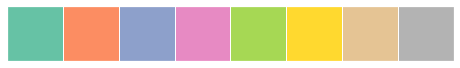

In [101]:
# Choosing a colour palette

sns.palplot(sns.color_palette("Set2", 8))

In [102]:
# Unique category labels: '1', '2', '3', '4'
color_labels = merged_pca_df['WPI_level'].unique()

# List of RGB triplets
rgb_values = sns.color_palette("Set2", 8)

# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))

# Finally use the mapped values => e.g.: plt.scatter(df['x'], df['y'], c=df['color'].map(color_map))

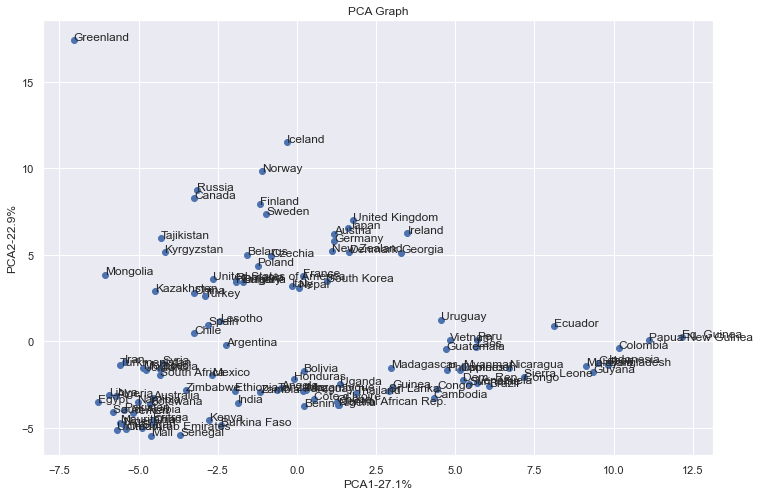

In [103]:
# Scatter plot PC1, PC2

plt.scatter(pca_df.PC1, pca_df.PC2)
plt.title('PCA Graph')
plt.xlabel('PCA1-{0}%'.format(per_var[0]))
plt.ylabel('PCA2-{0}%'.format(per_var[1]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))

plt.show()

# points that cluster together tend to be similar

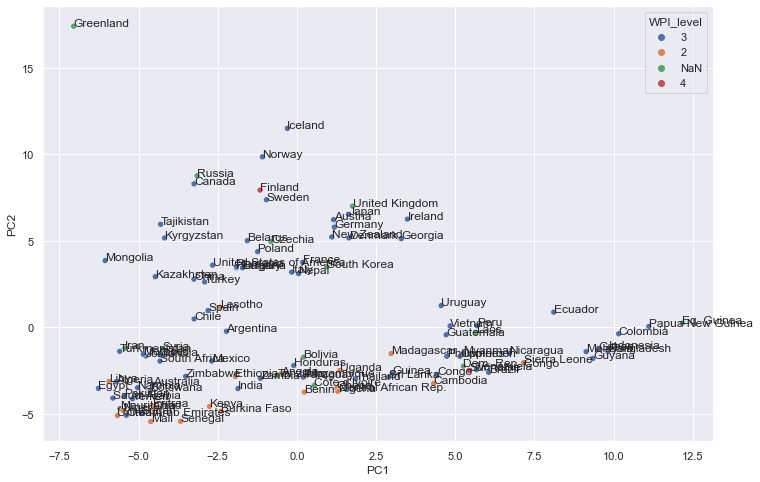

In [104]:
# Scatter plot PC3, PC4 data points coloured by world poverty index

g = sns.scatterplot(x="PC1", y="PC2", hue="WPI_level", data = merged_pca_df)
for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC1.loc[sample], merged_pca_df.PC2.loc[sample]))


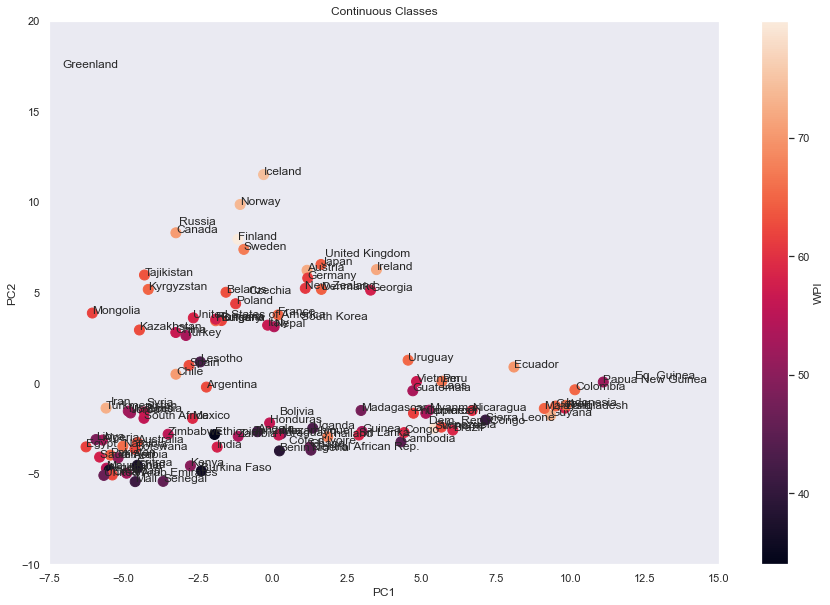

In [105]:
# Continuous classes PC1, PC2
plt.rcParams['figure.figsize'] = [15, 10]

plt_scatter_2002 = plt.scatter(np.array(merged_pca_df.PC1), np.array(merged_pca_df.PC2), c = np.array(merged_pca_df["WPI"]), s=100)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Continuous Classes")
plt.xlim([-7.5,15])
plt.ylim([-10,20])
plt.colorbar(label = "WPI")
plt.grid()

for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC1.loc[sample], merged_pca_df.PC2.loc[sample]))

plt.show()

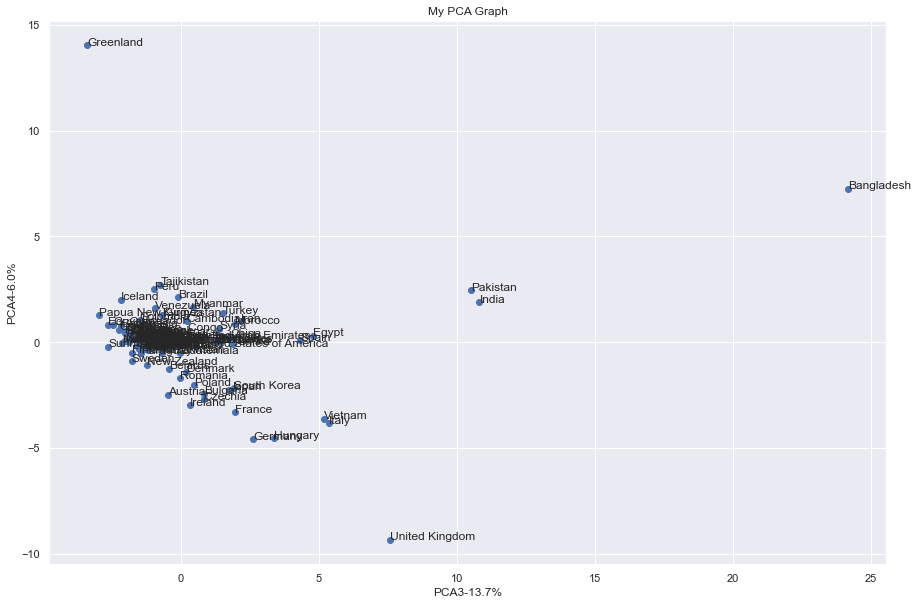

In [106]:
# Scatter plot PC3, PC4
plt.rcParams['figure.figsize'] = [15, 10]

plt.scatter(pca_df.PC3, pca_df.PC4)
plt.title('My PCA Graph')
plt.xlabel('PCA3-{0}%'.format(per_var[2]))
plt.ylabel('PCA4-{0}%'.format(per_var[3]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC3.loc[sample], pca_df.PC4.loc[sample]))

plt.show()

# points that cluster together tend to be similar

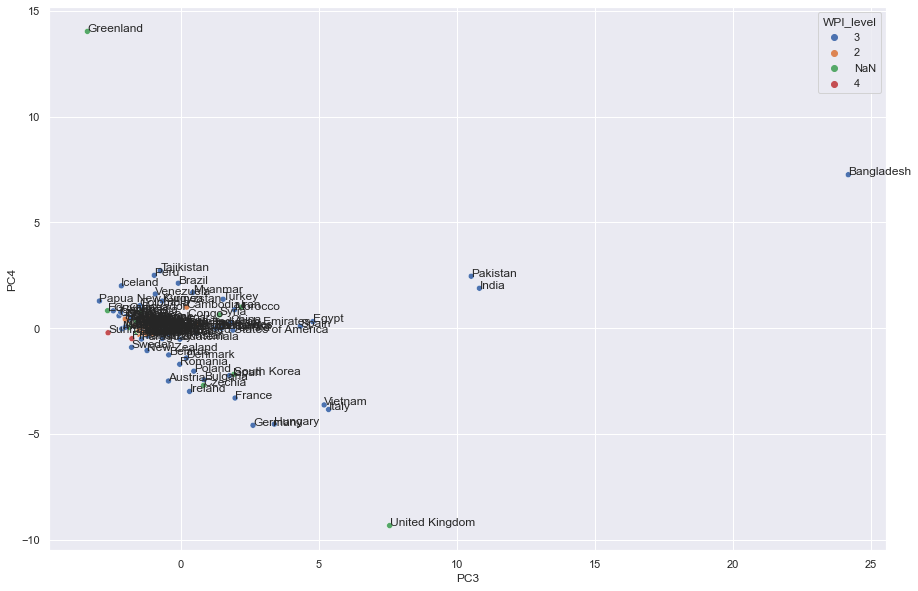

In [107]:
# Scatter plot PC3, PC4 data points coloured by world poverty index
plt.rcParams['figure.figsize'] = [15, 10]

g = sns.scatterplot(x="PC3", y="PC4", hue="WPI_level", data = merged_pca_df)
for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC3.loc[sample], merged_pca_df.PC4.loc[sample]))


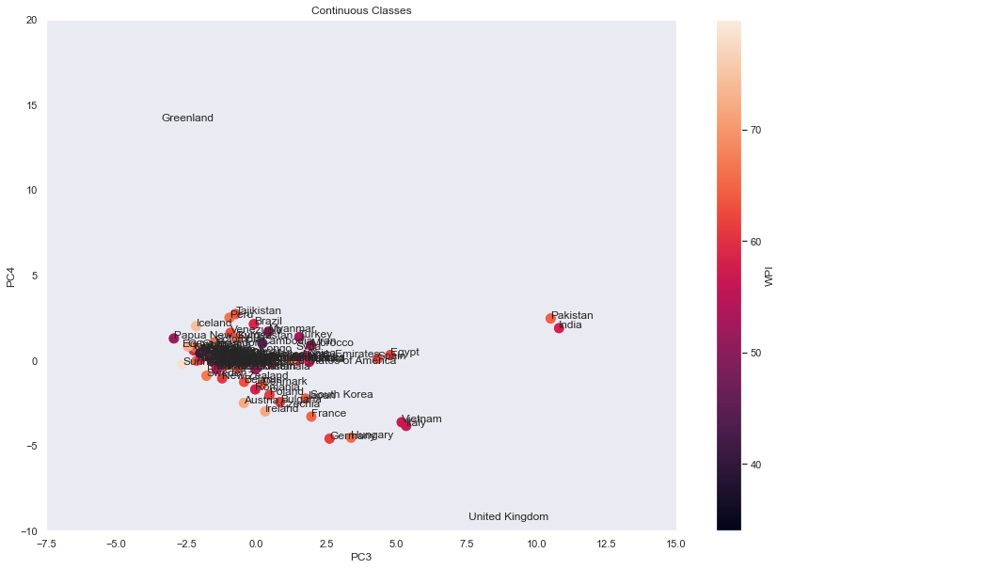

In [108]:
# Continuous classes PC3,PC4
plt.rcParams['figure.figsize'] = [15, 10]

plt.scatter(np.array(merged_pca_df.PC3), np.array(merged_pca_df.PC4), c = np.array(merged_pca_df["WPI"]), s=100)
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.title("Continuous Classes")
plt.xlim([-7.5,15])
plt.ylim([-10,20])
plt.colorbar(label = "WPI")
plt.grid()

for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC3.loc[sample], merged_pca_df.PC4.loc[sample]))

plt.show()

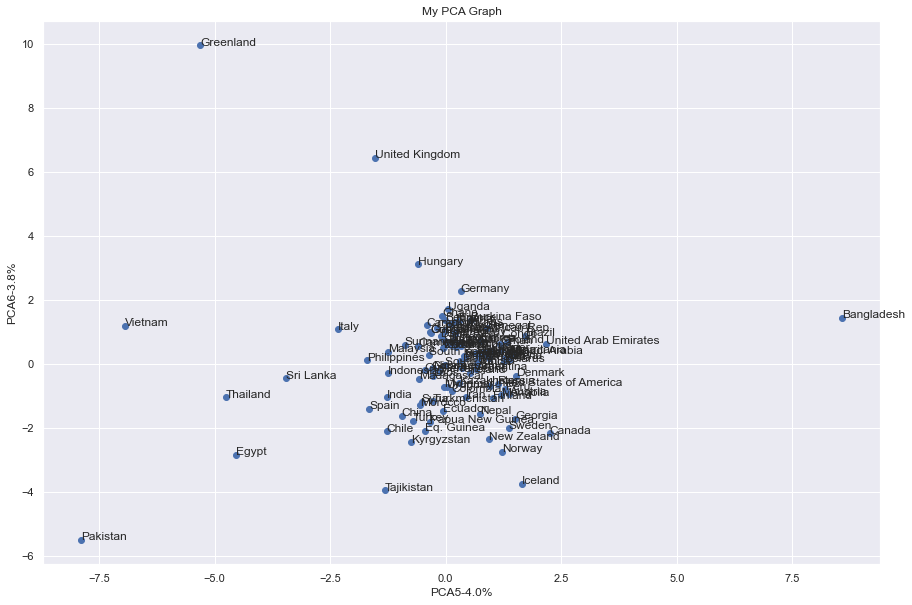

In [109]:
# Scatter plot PC5, PC6
plt.rcParams['figure.figsize'] = [15, 10]

plt.scatter(pca_df.PC5, pca_df.PC6)
plt.title('My PCA Graph')
plt.xlabel('PCA5-{0}%'.format(per_var[4]))
plt.ylabel('PCA6-{0}%'.format(per_var[5]))

for sample in pca_df.index:
    plt.annotate(sample, (pca_df.PC5.loc[sample], pca_df.PC6.loc[sample]))

plt.show()

# points that cluster together tend to be similar

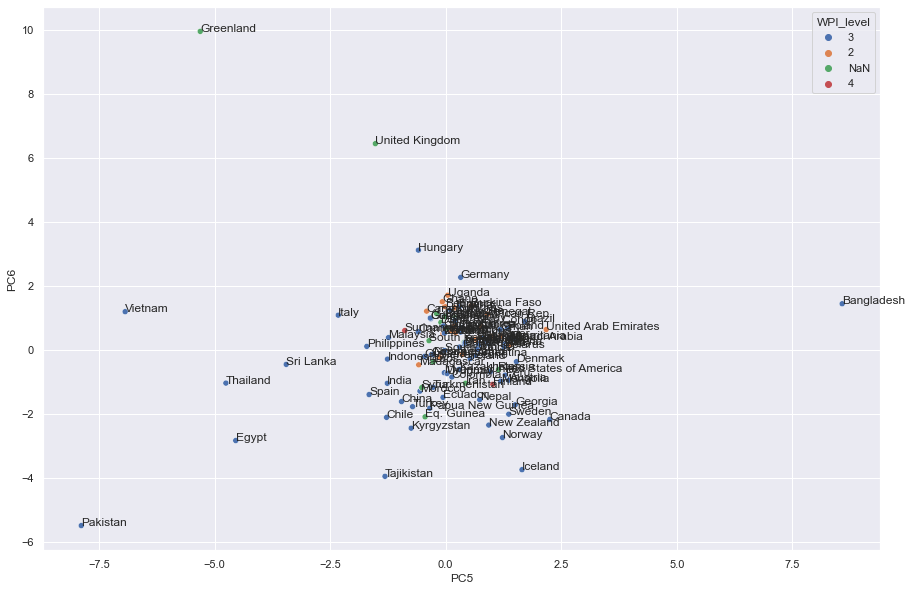

In [110]:
# Scatter plot PC5, PC6 data points coloured by world poverty index
plt.rcParams['figure.figsize'] = [15, 10]

g = sns.scatterplot(x="PC5", y="PC6", hue="WPI_level", data = merged_pca_df)
for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC5.loc[sample], merged_pca_df.PC6.loc[sample]))

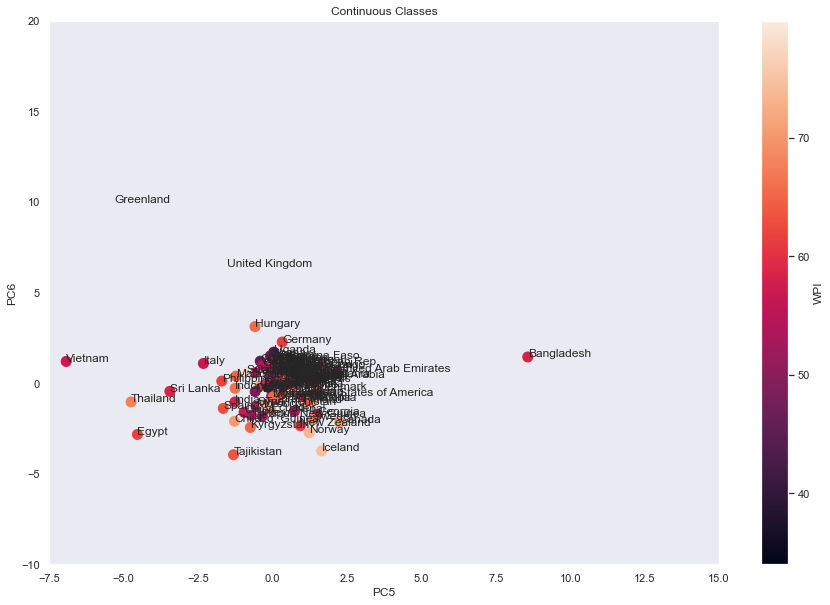

In [111]:
# Continuous classes PC5,PC6
plt.rcParams['figure.figsize'] = [15, 10]

plt.scatter(np.array(merged_pca_df.PC5), np.array(merged_pca_df.PC6), c = np.array(merged_pca_df["WPI"]), s=100)
plt.xlabel("PC5")
plt.ylabel("PC6")
plt.title("Continuous Classes")
plt.xlim([-7.5,15])
plt.ylim([-10,20])
plt.colorbar(label = "WPI")
plt.grid()

for sample in merged_pca_df.index:
    plt.annotate(sample, (merged_pca_df.PC5.loc[sample], merged_pca_df.PC6.loc[sample]))

plt.show()

In [112]:
column_names=list(df2002_by_country2.iloc[:, 2:].columns)

In [113]:
# Which variable had the biggest effect on separating the observations? => Loading scores on PC1

loading_scores = pd.Series(pca.components_[0])
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_10_vars = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_vars])

18   0.21
17   0.21
64   0.20
70   0.20
67   0.20
69   0.20
13   0.19
6    0.19
4    0.19
34   0.19
dtype: float64


In [114]:
# Which variable had the biggest effect on separating the observations? => Loading scores on PC4

loading_scores = pd.Series(pca.components_[5])
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_10_vars = sorted_loading_scores[0:10].index.values
print(loading_scores[top_10_vars])

76    0.31
77    0.31
1    -0.30
41   -0.22
39    0.22
62   -0.22
53    0.20
15   -0.18
19    0.18
61    0.17
dtype: float64


## Correlation Plots

In [115]:
# Loadings Matrix

# component loadings or weights (correlation coefficient between original variables and the component) 
# component loadings represents the elements of the eigenvector
# the squared loadings within the PCs always sums to 1
loadings = pca_out.components_
num_pc = pca_out.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
dfxx = df_geo.drop(['lon', 'lat', 'geometry'], axis=1)
loadings_df['variable'] = dfxx.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002_ACond_tavg,0.13,0.05,-0.08,-0.01,0.01,-0.13,-0.02,-0.12,0.05,-0.22,-0.01,0.06,0.19,-0.27,-0.15,0.31,-0.31,0.00,0.29,0.24,0.10,0.11,0.31,0.09,0.13,0.07,-0.17,0.14,-0.14,0.03,0.14,-0.07,0.12,0.11,-0.16,0.08,0.15,-0.06,0.19,-0.04,0.04,-0.04,-0.04,0.07,0.16,0.01,0.12,-0.02,0.01,-0.07,0.02,0.03,0.02,-0.03,0.04,0.00,0.00,-0.00,0.00,0.02,-0.01,-0.00,-0.00,-0.01,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00
2002_Albedo_inst,0.03,-0.11,0.03,-0.28,0.14,-0.30,-0.05,0.07,0.03,0.07,-0.04,-0.04,0.03,-0.04,0.00,-0.05,0.03,0.02,-0.07,-0.09,-0.04,-0.04,-0.03,0.08,0.08,0.05,-0.04,-0.01,0.01,0.03,-0.01,-0.01,0.04,0.01,-0.01,0.05,-0.00,0.05,-0.06,-0.04,0.10,-0.03,0.03,-0.04,0.04,0.23,0.01,0.08,0.22,-0.37,-0.57,-0.21,-0.02,-0.04,0.12,0.26,-0.05,0.04,-0.07,0.09,-0.01,0.04,-0.01,-0.04,-0.02,0.00,-0.01,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00
2002_AvgSurfT_inst,0.03,-0.23,0.01,-0.02,0.00,0.03,0.06,-0.09,0.00,0.07,-0.03,0.01,0.02,0.02,-0.03,-0.03,-0.01,0.02,0.02,0.05,-0.03,0.00,-0.02,-0.01,-0.01,0.08,0.02,0.01,-0.00,0.04,-0.03,-0.02,0.03,-0.01,-0.01,-0.01,0.04,0.05,-0.03,-0.03,0.05,0.00,0.07,0.07,-0.01,-0.01,0.00,0.01,0.01,-0.04,-0.08,0.04,-0.01,0.15,0.04,-0.24,0.03,-0.39,0.20,0.20,-0.11,-0.17,-0.09,0.01,-0.30,-0.60,0.25,0.02,-0.02,-0.01,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00
2002_CanopInt_inst,0.19,0.03,-0.04,-0.07,-0.04,0.03,-0.01,-0.07,-0.04,-0.04,0.02,-0.03,-0.02,-0.01,0.05,0.21,0.04,0.18,-0.15,-0.10,0.27,-0.06,-0.28,-0.11,0.09,0.15,0.15,0.01,-0.09,-0.02,-0.05,-0.07,-0.14,-0.22,0.09,-0.04,-0.23,0.14,0.38,0.25,-0.04,-0.14,0.06,-0.03,0.34,-0.01,0.18,-0.06,0.06,-0.15,0.06,0.15,-0.01,-0.03,0.08,-0.02,-0.00,-0.02,-0.00,0.02,-0.02,-0.01,-0.01,0.00,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00
2002_ECanop_tavg,0.19,-0.01,-0.07,0.00,-0.05,0.00,-0.06,-0.01,0.00,-0.11,-0.02,0.03,0.07,-0.15,0.03,0.18,-0.05,0.11,0.00,-0.04,0.24,-0.06,-0.16,0.03,0.12,0.08,0.00,0.07,-0.04,0.03,0.02,0.05,-0.05,-0.11,0.02,0.06,-0.09,0.14,0.12,-0.07,-0.11,0.08,0.08,-0.01,-0.57,0.11,-0.19,0.10,-0.11,0.33,-0.21,-0.16,-0.08,0.04,-0.11,-0.01,-0.08,-0.03,0.01,-0.03,-0.08,0.04,0.05,-0.05,0.02,-0.00,-0.01,-0.01,0.00,0.00,0.05,-0.06,0.14,-0.07,0.02,0.00,0.02,0.01,-0.02,-0.00
2002_ESoil_tavg,0.12,-0.00,0.07,-0.02,0.03,0.05,-0.18,0.34,-0.19,0.21,-0.15,-0.11,-0.11,0.18,0.03,-0.17,-0.06,-0.09,0.15,0.14,-0.07,0.05,0.17,-0.02,-0.18,-0.07,0.15,-0.04,-0.31,0.05,0.12,0.12,0.09,0.01,-0.18,-0.18,-0.08,0.07,0.34,0.03,-0.01,0.00,-0.03,0.03,-0.04,-0.01,0.11,0.03,0.00,-0.02,-0.05,0.03,-0.05,-0.02,-0.06,0.01,-0.06,-0.04,0.03,0.02,-0.16,0.06,0.07,-0.10,0.05,-0.01,-0.00,-0.02,0.00,0.00,0.08,-0.09,0.22,-0.11,0.03,0.01,0.03,0.02,-0.03,-0.00
2002_Evap_tavg,0.19,-0.02,-0.02,0.01,-0.04,0.04,-0.17,0.14,-0.11,0.04,-0.06,-0.04,0.07,-0.03,0.06,-0.01,-0.08,-0.05,0.09,0.05,0.07,0.01,-0.12,0.01,0.01,-0.02,-0.00,-0.09,-0.02,0.06,0.03,0.03,-0.06,0.00,-0.05,-0.01,-0.04,-0.06,-0.07,-0.05,-0.03,0.02,0.00,0.01,-0.01,-0.14,-0.03,0.01,0.06,0.00,-0.04,0.01,-0.02,-0.04,-0.01,0.07,0.01,-0.04,-0.07,0.01,0.45,-0.17,-0.22,0.28,-0.14,0.08,0.05,0.62,0.00,-0.02,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00
2002_LWdown_f_tavg,0.12,-0.18,-0.01,-0.02,-0.02,0.07,-0.01,-0.09,-0.05,0.09,-0.04,-0.03,0.02,-0.05,-0.01,-0.06,0.03,-0.02,-0.03,0.06,0.00,0.02,0.04,-0.05,0.06,-0.01,0.07,0.15,0.06,0.07,-0.09,-0.04,0.05,-0.09,-0.10,0.05,0.06,0.11,-0.01,-0.08,-0.14,0.11,0.00,0.04,-0.04,-0.13,-0.02,0.03,0.03,-0.11,-0.01,0.18,-0.10,0.41,0.09,-

In [116]:
# Sorting loadings by PC1
loadings_sorted_df = loadings_df.sort_values("PC1")
loadings_sorted_df.head()

# positive and negative values in component loadings reflects the positive and negative 
# correlation of the variables with the PCs. 

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002_Wind_f_inst,-0.15,0.12,0.02,-0.02,0.03,-0.06,0.12,0.06,0.07,0.09,-0.12,-0.03,-0.11,0.20,-0.05,-0.01,0.03,0.12,-0.03,0.14,0.07,0.11,0.12,-0.02,0.52,0.16,-0.16,-0.25,-0.04,0.34,0.11,-0.07,-0.20,-0.11,-0.14,-0.18,0.07,0.25,-0.14,0.17,0.02,0.04,-0.10,0.10,-0.09,-0.06,-0.02,0.02,0.07,0.02,0.08,0.00,0.01,-0.02,-0.02,0.01,0.01,0.02,0.01,-0.00,0.01,-0.01,-0.00,0.01,-0.01,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00
2002_Qh_tavg,-0.11,-0.16,-0.03,0.06,-0.02,-0.01,0.07,0.18,0.03,-0.03,-0.04,0.15,-0.15,-0.14,-0.20,-0.00,0.01,0.13,-0.20,-0.15,-0.00,0.08,0.25,-0.12,-0.01,-0.23,-0.06,0.05,-0.11,-0.17,0.07,-0.09,-0.15,-0.34,-0.00,0.15,0.10,0.04,-0.03,-0.10,-0.13,0.02,0.13,0.14,0.08,-0.04,-0.02,-0.05,-0.01,-0.02,-0.01,-0.03,-0.03,-0.07,0.06,-0.03,0.01,-0.04,0.02,-0.03,-0.26,0.06,0.12,-0.08,0.04,0.04,0.03,0.42,0.01,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00
2002_qrswb,-0.06,-0.07,-0.00,0.05,-0.04,-0.04,-0.02,0.05,0.16,0.21,0.25,-0.24,-0.60,-0.33,-0.22,0.15,0.08,-0.21,0.32,0.08,0.04,-0.08,-0.19,-0.02,0.11,-0.05,0.04,-0.09,0.03,-0.02,-0.09,-0.01,0.06,-0.02,-0.01,0.04,0.03,-0.01,0.02,0.03,0.00,-0.01,0.01,0.00,0.01,0.04,-0.01,-0.00,-0.02,-0.01,0.00,0.01,-0.01,0.02,-0.04,0.02,-0.02,-0.01,0.00,0.00,0.01,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.02,0.01,-0.00,0.02,-0.06,-0.03,0.00,0.00,-0.00
2002_SWdown_f_tavg,-0.04,-0.21,-0.03,0.09,-0.02,0.00,0.05,0.13,0.05,0.01,-0.03,0.14,0.03,-0.00,-0.08,0.03,-0.07,0.06,-0.01,0.03,0.04,0.03,-0.12,0.02,-0.05,0.07,-0.08,-0.23,-0.03,-0.03,0.12,-0.02,-0.11,-0.02,0.13,-0.03,0.12,0.01,0.12,-0.26,-0.20,0.07,-0.42,-0.56,-0.00,0.11,0.15,0.05,-0.00,-0.14,0.05,-0.05,0.16,0.14,-0.12,-0.04,-0.02,-0.01,0.06,-0.03,0.01,-0.00,0.01,-0.01,0.00,-0.01,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00
2002_SnowDepth_inst,-0.04,0.16,-0.04,0.25,-0.08,0.14,0.04,-0.12,-0.01,0.13,-0.03,0.03,0.04,-0.11,-0.03,-0.10,-0.02,0.01,-0.05,0.04,-0.03,0.01,-0.07,-0.01,0.01,0.01,-0.02,0.01,-0.04,-0.05,0.03,0.02,-0.04,0.04,0.01,0.13,-0.07,-0.17,0.05,0.19,-0.25,0.04,-0.29,0.22,-0.08,-0.01,0.05,0.07,0.08,-0.09,-0.09,-0.03,-0.02,-0.02,0.03,0.24,-0.11,0.18,-0.02,0.06,-0.29,-0.32,0.01,0.05,-0.41,0.05,-0.06,-0.03,-0.02,-0.01,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00


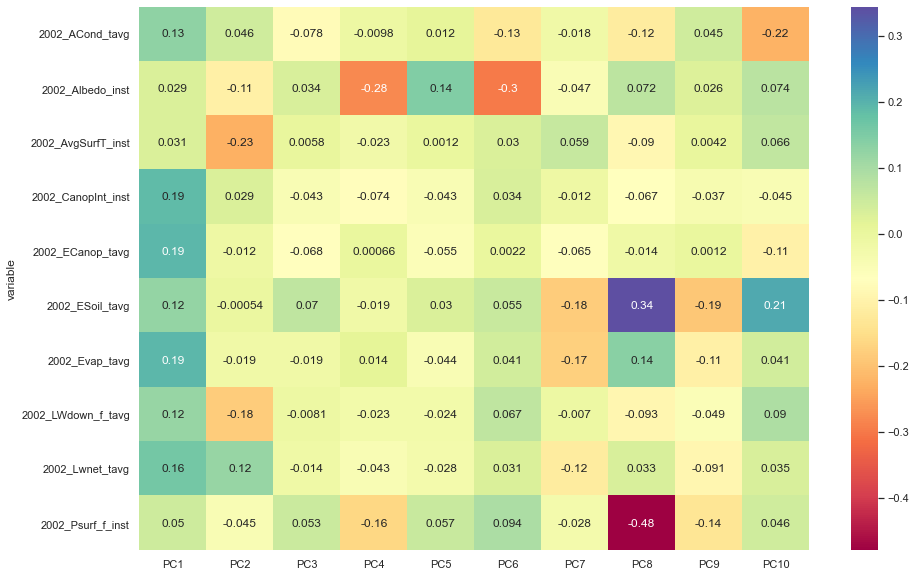

In [117]:
# (First 10 variables on the first 10 PC's only, more cannot be visualized at once)
# get correlation matrix plot for loadings
ax = sns.heatmap(loadings_df.iloc[0:10, 0:10], annot=True, cmap='Spectral')
plt.show()

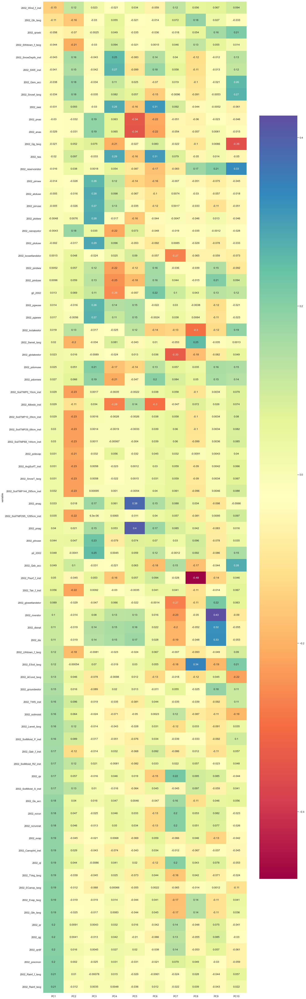

In [118]:
# on loadings_sorted_df (80 variables on the first 10 PC's)
# %matplotlib qt 
plt.rcParams['figure.figsize'] = [20, 80]
ax = sns.heatmap(loadings_sorted_df.iloc[0:, 0:10], annot=True, cmap='Spectral')
plt.show()

In [119]:
# all at once...
plt.rcParams['figure.figsize'] = [200, 200]
ax = sns.heatmap(loadings_sorted_df, annot=True, cmap='Spectral')
plt.show()

## Biplots

### 2D

In [120]:
features = np.array(df_2002_pca.columns)
pca = PCA(n_components=2)
components = pca.fit_transform(scaled_data)

In [121]:
var = pca.explained_variance_ratio_.sum()
fig2D_2002 = px.scatter(components, x=0, y=1, text=merged_pca_df.index, color=merged_pca_df['WPI'],title=f'Total Explained Variance: {var}',
labels={'0':'PC1', '1':'PC2'})
for i, feature in enumerate(features):
    fig2D_2002.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig2D_2002.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig2D_2002.show()

### 3D

In [122]:
pca = PCA(n_components=3)
components = pca.fit_transform(scaled_data)

In [123]:
var = pca.explained_variance_ratio_.sum()
fig3D_2002 = px.scatter_3d(components, x=0, y=1, z=2, text=merged_pca_df.index, color=merged_pca_df['WPI'],title=f'Total Explained Variance: {var}',
labels={'0':'PC1', '1':'PC2', '2':'PC3'})
fig3D_2002.show()

# Comparing PCA Biplots (2002, 2050)

In [124]:
fig2D_2002.show()

In [125]:
fig2D_2050.show()

In [126]:
fig3D_2002.show()

In [127]:
fig3D_2050.show()